### Background of the project: 
##### Chromatin organization plays a key role in identifying and regulating the relationship between gene structure and function. Analysis of single-molecule data often becomes difficult due to heterogeneity. Therefore ChromaFactor is a novel approach which uses the concept of non-negative matrix factorization(NMF) which tranforms the single molecule chromatin organization datasets to primary components.Each of these componenets captures variance in dataset and also tell how each molecule contributes to each structural pattern. In this research, human and fly single-molecule imaging data are used by which the authors found that major components correlate with functions like active transcription, enhancer–promoter distance, and genomic compartment. Also they discovered that patterns observed in bulk measurements do exist in single-cell level but only for a small subpopulation.

##### Why NMF is useful for single-cell chromatin data?
- Noisy Dataset
- Heterogenous in nature
- Non-negative in nature

##### ChromaFactor helps in identifying the relationship between chromatin structure and function at the single-molecule level.

<hr style="height:3px; background-color:black; border:none;">

### In this study we are reproducing four figures(https://github.com/lgunsalus/ChromaFactor)

<h1 style="color: blue;">Figure 1: Visualize single molecules and apply ChromaFactor

### Recreate Figure 1 from the manuscript.

Example plotting cells, processing ORCA data, plotting median maps.

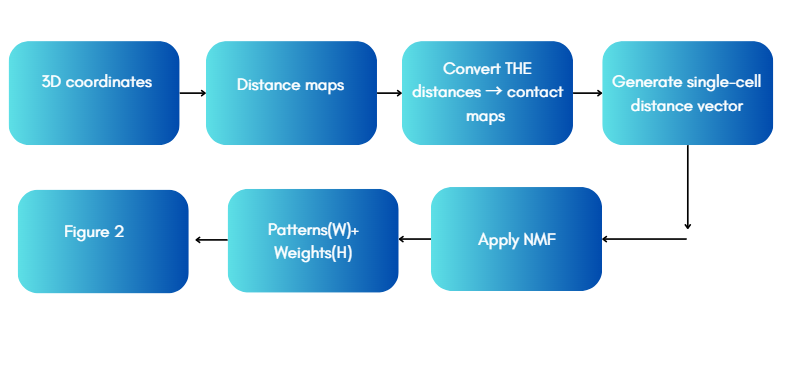

In [187]:
from IPython.display import Image, display
display(Image('Figure 1.png'))

In [1]:
import pandas as pd
import numpy as np

In [2]:
# File paths for DNA and RNA datasets(Drosophila Bithorax complex locus)
dna_file = "dnaData_exp1.csv"
rna_file = "rnaData_exp1.csv"

In [3]:
# Loading the CSV files
dna_data = pd.read_csv(dna_file)
rna_data = pd.read_csv(rna_file)

In [150]:
dna_data.shape


(676632, 8)

In [151]:
rna_data.shape

(23978, 32)

#### Details of dataset ORCA DNA dataset
- DNA ORCA Dataset Contains 676632 rows and 8 columns
- Around 20k cells are measured
- Each cell has 50kb region
- Each loci has 3 coordinates(x,y,z)
- Columns: ID of the cell that spot belongs to, experiment batch ID, segNumber(DNA molecule ID),(x,y,z)-coordinates of the loci, barcode-locus ID ,brightness denotes the spot quality

#### Details of the RNA dataset
- Each row corresponds to one molecule and columns are the transcription-related measurements of the DNA molecule
- This dataset is mainly used in Figure 3

In [4]:
#For ignoring the warning
import warnings
warnings.filterwarnings('ignore')

In [5]:
# Adding the local 'code' directory to the Python search path by which custom modules can be imported
import sys
sys.path.append('code')  

#Importing the dependency file
from DeepLearningChromatinStructure_code import *  # Rajpurkar et al. ORCA processing code 
from plot import *                                 # Plotting functions for 2D and 3D data
from utils import *                                # Util functions for 2D and 3D data
from ChromaFactor import *                         # ChromaFactor methods 

In [1]:
# import importlib
# #importlib.reload(DeepLearningChromatinStructure_code)  # Reload the module after you've made changes to the file
# importlib.reload(plot) 

# Process ORCA data

In [6]:
%run -i "C:/Users/athir/Maths Project/DeepLearningChromatinStructure_code.py"

In [7]:

seed = 42
tag = "exp_1"

# Read DNA + RNA ORCA data
# xyzdat : 3D DNA coordinates for each locus
# rnadat : RNA expression associated with each DNA locus
xyzdat, rnadat = read_data(dna_file, rna_file) # read in data
xyzdat = fill_in_missing(xyzdat)               # fill in missing points with nas


# Filter loci based on quality / missing thresholds
xyzfilt, rnafilt = filter_dat(xyzdat, rnadat, req_xyz_perc = 0.5, interpol=True, norm = True, bool_thresh = 1)

In [155]:
xyzfilt.shape

(23641, 52, 3)

#### The molecules are reduced since it has many missing loci, having 52 loci and 3 coordinates per loci

In [154]:
rnafilt.shape

(23641, 29)

#### 3D DNA data is loaded, RNA expression is also loaded for same molecules which is used later, some loci is missing which is filled using the function using filter_dat function, low quality molecules are filtered out

In [8]:
# List of all RNA region labels from experiment 1

# These correspond to gene exons/introns measured by ORCA
rna_list = ["AbdB_Main_Exon", "AbdB_Short_Exon", "AbdA_Exon", "Ubx_Exon", "Antp_Exon", "Scr_Exon", "Dfd_Exon",
            "pb_Exon", "lab_Exon", "Iab4_ncGene", "bxd_ncGene", "inv_Exon", "en_Whole_Gene", "ftz_Whole_Gene",
            "zen_Whole_Gene", "Ama_Whole_Gene", "sna_Whole_Gene", "elav_Exon", "AbdB_Main_Intron", 
            "AbdB_Short_Intron", "AbdA_Intron", "Ubx_Intron", "Antp_Intron", "Scr_intron", "Dfd_Intron", 
            "pb_Intron", "lab_Intron", "inv_Intron", "elav_Intron"]
# This list contains the RNA signals which have gene exons and introns

In [9]:
# Convert list of filtered xyz coordinate sets into a NumPy array
# all_maps has shape: [num_cells × num_loci × 3] same as xyzfilt
all_maps = np.asarray(xyzfilt)

#Compute median Euclidean distance map across all cells
median_distance_map_combined = np.nanmedian(all_maps, axis = 0) #52 x 3

# Generate the contact map
contact_th = 500
contact_map_combined = np.sum(all_maps<contact_th, axis=0) / np.sum(np.isnan(all_maps)==False, axis=0) #52 x 3

- First the xyzfilt is converted to Numpy array
- Next Median 3D distance map is calculated, here cell dimension is collapsed, locus is kept, coordinate is kept
- Contact map is generated by checking whether the Euclidean distance is less than 500nm

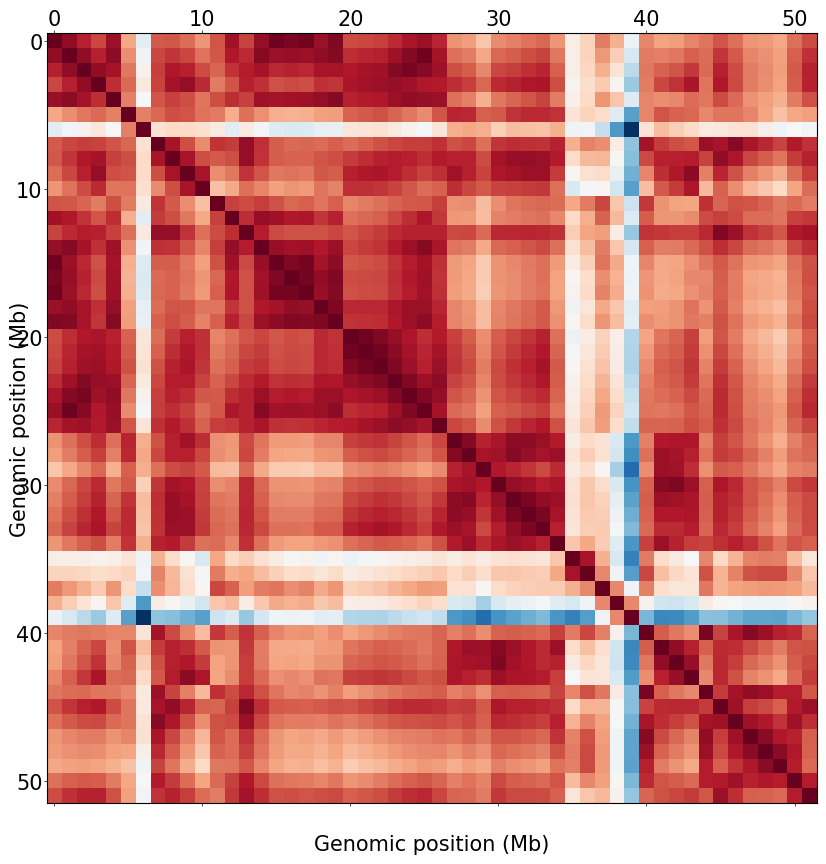

In [10]:
# Compute and plot the pairwise 3D distance matrix for one ORCA cell, showing how close or far each genomic locus is from every other locus
single_map = xyzfilt[4] #(52x3)
ex_map = get_distance_matrix(single_map)#d(i,j) (52,52)
plot_distance_matrix(ex_map, cmap_order="forward")

## Inference of plot
- This plot represents the 3D distance between two genomic loci at each point or visualization of the pairwise euclidean distance
- The colours represent how far the two loci is in a cell
- Dark read : close loci
- light red : loci are far
- blue : unusually tight
- white: Shows that certain loci are far
- Therefore  diagonal region shows that some loci are very close to each
- X= locus i
- Y= locus j

In [11]:
%matplotlib inline

In [12]:
%run -i "C:/Users/athir/Maths Project Nov/utils.py"

In [188]:
# Generating random 3D coordinates (100 points with x, y, z)  for testing the plotting functions
single_map = np.random.rand(100, 3)

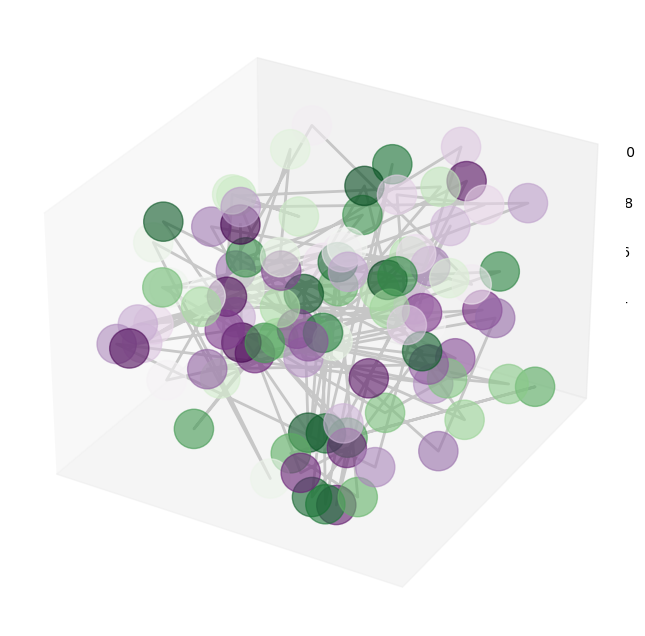

In [189]:
# Loading the utility functions, generate sample 3D coordinates, and visualize them using the 3D plotting function.
original = pd.DataFrame(single_map, columns=['x', 'y', 'z'])
plot_in_3d(original, point_size=800)


- 100 points are plotted in 3D and it is visualizing poistions for testing 3D plotting function

In [15]:
# Select a cell and display its RNA expression value for the Abd-A exon.
cur_cell_number = 0
rna_data.iloc[cur_cell_number]['Abd-A_Exon']

np.int64(0)

#### This step is to ensure whether RNA vlaues for each cell can be accessed and can be used later to read the gene expression

## Mapping dictionaries

In [16]:
# Creating two dictionaries: one is mapping each RNA ID to its index, and the another is mapping each index back to its RNA ID

rna_to_index = dict(zip(rna_list, list(range(len(rna_list)))))
index_to_rna = dict(zip(list(range(len(rna_list))),rna_list))

- Two dictionaries are created to convert the RNA gene names to numeric indices and vice versa for later processing

# Plot median distance maps

In [17]:
#Based on gene expression, cells are separated
gene_name = "AbdA_Exon"
rna_no = rna_to_index[gene_name]

# Extract the RNA filter data corresponding to the gene index,
# transposed for correct orientation. 
y = rnafilt.T[rna_no]

positive_mask = np.array(y, dtype=bool)
negative_mask = ~np.array(y, dtype=bool)

positive = all_maps[positive_mask] #RNA ON
negative = all_maps[negative_mask] #RNA OFF

# Compute distance matrices for each set of positive maps 
positive_maps = np.asarray([get_distance_matrix(single_map) for single_map in positive]) #SELECT DNA DIST MATRICES

# Compute distance matrices for each set of negative maps 
negative_maps = np.asarray([get_distance_matrix(single_map) for single_map in negative])

#Distance matrices are grouped by the RNA expression states

# Calculate the median of the positive distance matrices along the 0th axis (row-wise median).
positive_median = np.nanmedian(positive_maps, axis=0)
# Calculate the median of the negative distance matrices along the 0th axis (row-wise median).
negative_median = np.nanmedian(negative_maps, axis=0)

- RNA expression values of AbdA_Exon for all cells is obtained
- Then the cells are splitted to positive and negative
- Taking the 3D distance matrices for each groups
- The median distance map is computed for both the type of cells
- Here it is checked that whether AbdA-positive chromatin look different from AbdA-negative chromatin
- This tells whether gene expression is associated with the changes in the chromatin folding or not
  

In [19]:
negative_maps.shape

(12577, 52, 52)

In [20]:
positive_maps.shape

(3743, 52, 52)

In [21]:
positive_median.shape

(52, 52)

- 12577 cells are AbdA-negative and 3,743 cells are AbdA positive 
- The pairwise distance calculate distance between 52 genomic loci for each of the cell
- Here Euclidean distance is also calculated

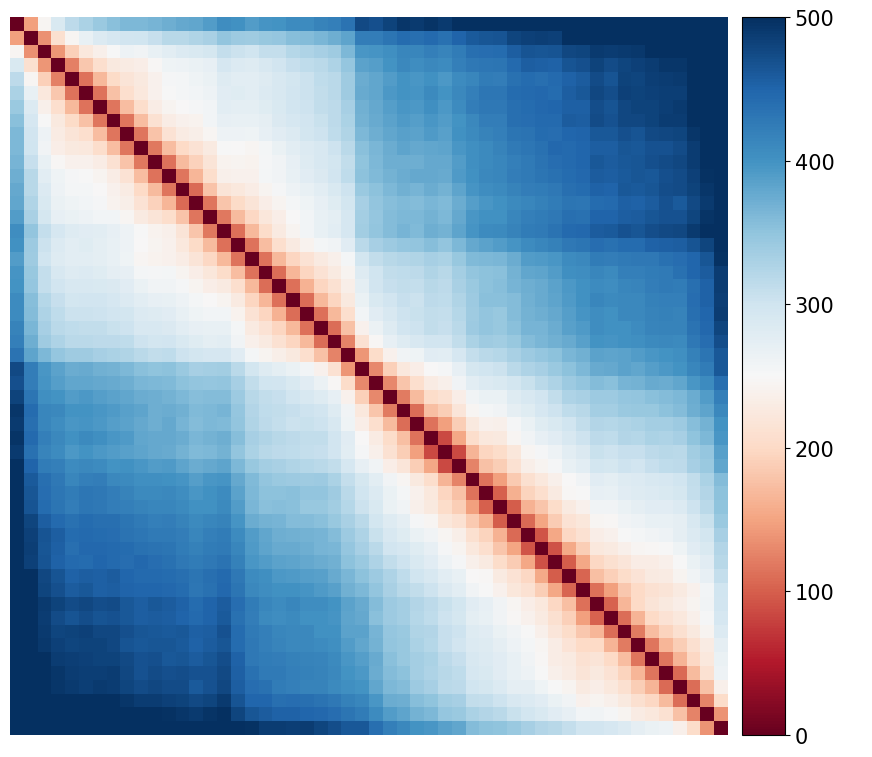

In [22]:
# Plotting the median positive distance map for the gene using athe forward colormap
# Basically we are plotting DNA distance matrices based on RNA expression status

plot_distance_matrix(positive_median, cmap_order="forward", 
                    title = f"{gene_name}, Positive Maps, n={len(positive)}",
                     vmax=500,
                    ax_label = None, hide_all=True,
                    colorbar_labels=' ')

- Here the dark diagonal represents that adjacent loci are close in 3D
- The gradients indicates how the distance will increase as the genomic separation increases
- The blue region indicates  the loci pairs which are far away in the positive cells
- So this figure represents how each pair of these loci is far and close in positive cells

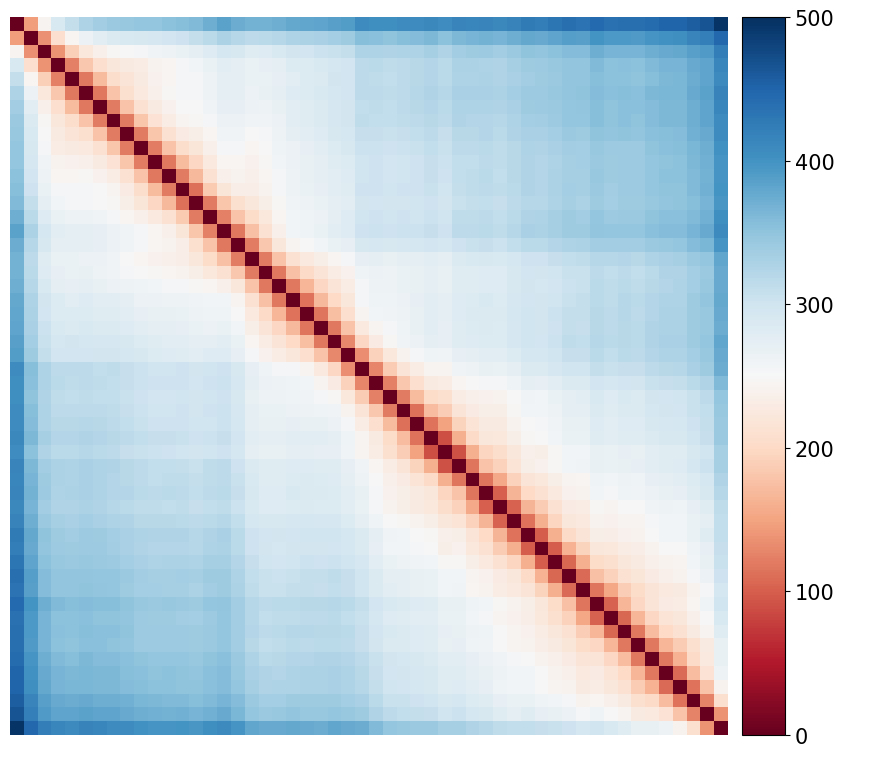

In [23]:
plot_distance_matrix(negative_median, cmap_order="forward", 
                    title = f"{gene_name}, Positive Maps, n={len(positive)}",
                    vmax=500,
                    ax_label = None, 
                     hide_all=True,
                     colorbar_labels=' ')

- This plot indicats that the chromatin structure is more open in this(since light blue and blue are more)
- The dark diagonal indicates that neighbouring loci remain close
- The light red colour region is weak,which indicates it is relatively close but not tightly packed 

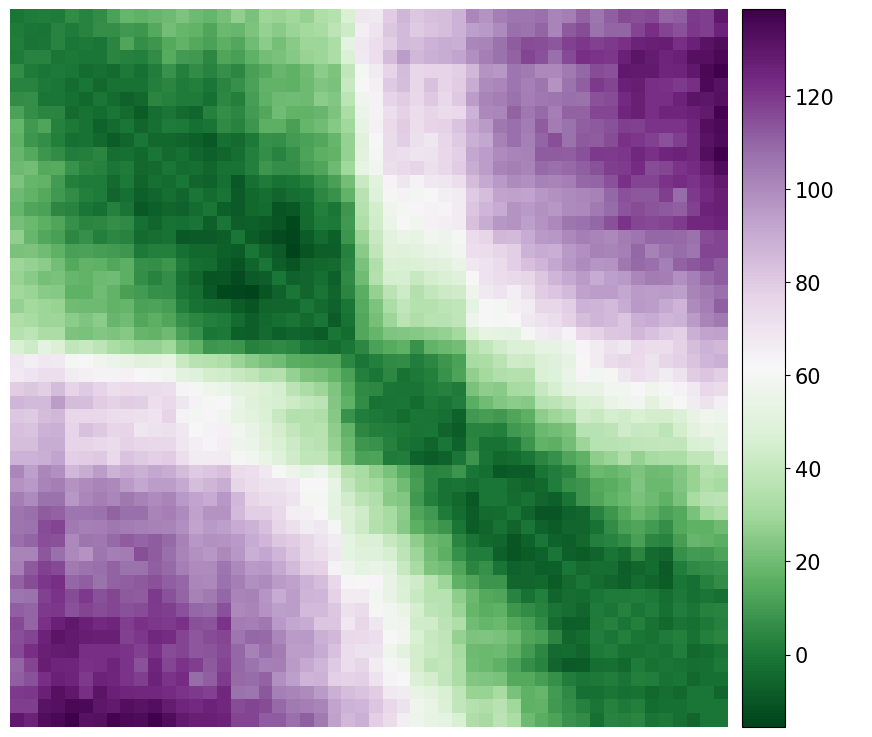

In [24]:
plot_distance_matrix(positive_median - negative_median, cmap_order="forward", 
                    title = f"{gene_name}, Positive - Negative Maps", alt_cmap = 'PRGn_r',
                    ax_label = None, hide_all=True,
                                        colorbar_labels=' ')

- The difference between positive and negative cells are shown
- The green block indicates that genomic regions becomes closer in AbdA-positive cells, chromatin compaction happens in this region (positive cells are closer than that in the negative cells)
- The purple regions become apart in the AbdA-poistive cells, which indicates open structure(positive cells are far than negative cells)
- White indicates no difference between positive and negative regions
- Basically it is a comparison plot

# Plot individual cell examples

### (transcribed and not transcribed)

In [25]:
np.sum(y) # Total no.of cells where gene is expressed, 3,743 cells have AbdA Exon = 1

np.int64(3743)

In [26]:
y.shape #Total no of cells is printed

(16320,)

In [27]:
cell_no = 16319
label = y[cell_no]
label                #If label=1 then positive else if it is 0 then negative

np.int64(1)

In [28]:
#Added newly
%run -i "C:/Users/athir/Maths Project Nov/fish_preprocessing.py"

In [29]:
dna_data.columns = dna_data.columns.str.strip().str.lower()   #Cleaning of the column names in dna_data for further analysis
print(dna_data.columns) 

Index(['cellnumber', 'embnumber', 'segnumber', 'x', 'y', 'z', 'brightness',
       'barcode'],
      dtype='object')


<Figure size 640x480 with 0 Axes>

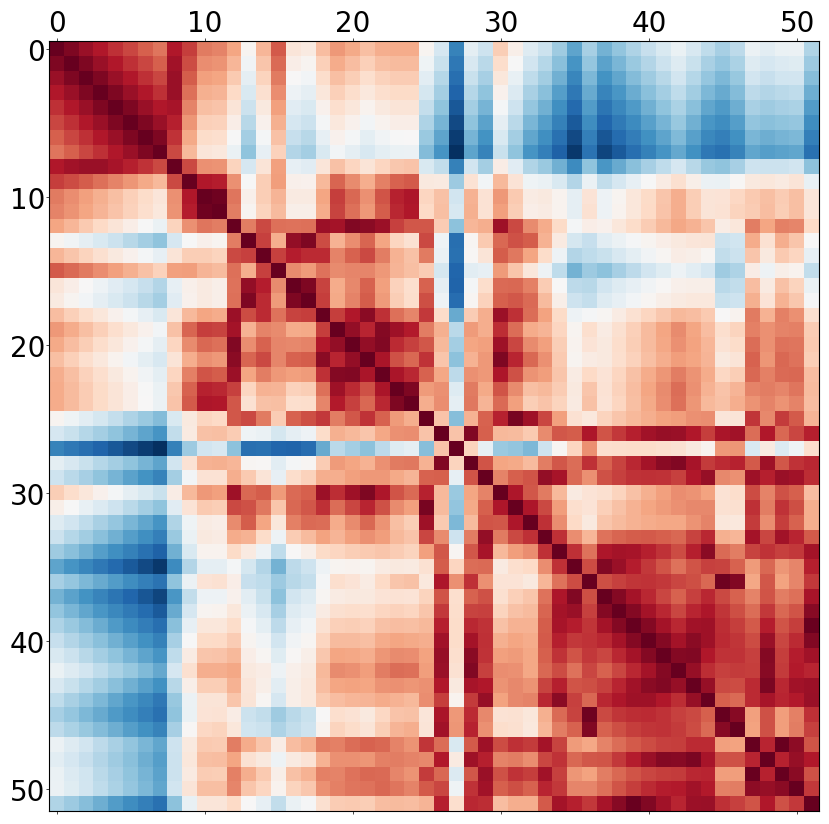

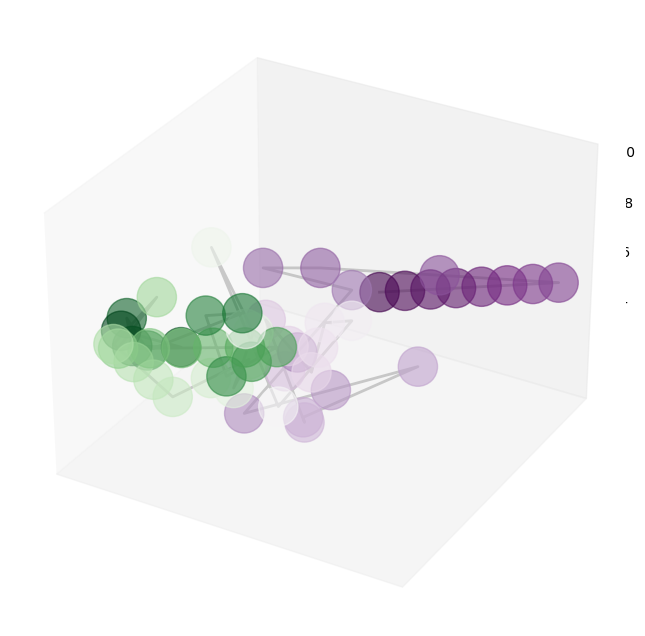

In [30]:
single_map = xyzfilt[cell_no]  # this is an (N, 3) 52×3 matrix containing the (x,y,z) positions of all 52 loci for that one cell

# Make a DataFrame with names your distance-function expects
original_df = pd.DataFrame(single_map, columns=['X(nm)', 'Y(nm)', 'Z(nm)'])

# Computing the Euclidean distance matrix for the cell
dm = get_distance_matrix(original_df) 

# Plot original distances
plot_distance_matrix(dm, cmap_order="forward", ax_label=None)

# 3D plot (plot_in_3d expects 'x','y','z' lowercase)
original_xyz = pd.DataFrame(single_map, columns=['x','y','z'])
plot_in_3d(original_xyz, point_size=800)


### Inference
- The genome is is folded into subdomains in structured manner rather than being randomly arranged.
- The compact red domains are separated by more blue/open regions.

In [31]:
y.shape

(16320,)

### Plot non-transcribed cell

0


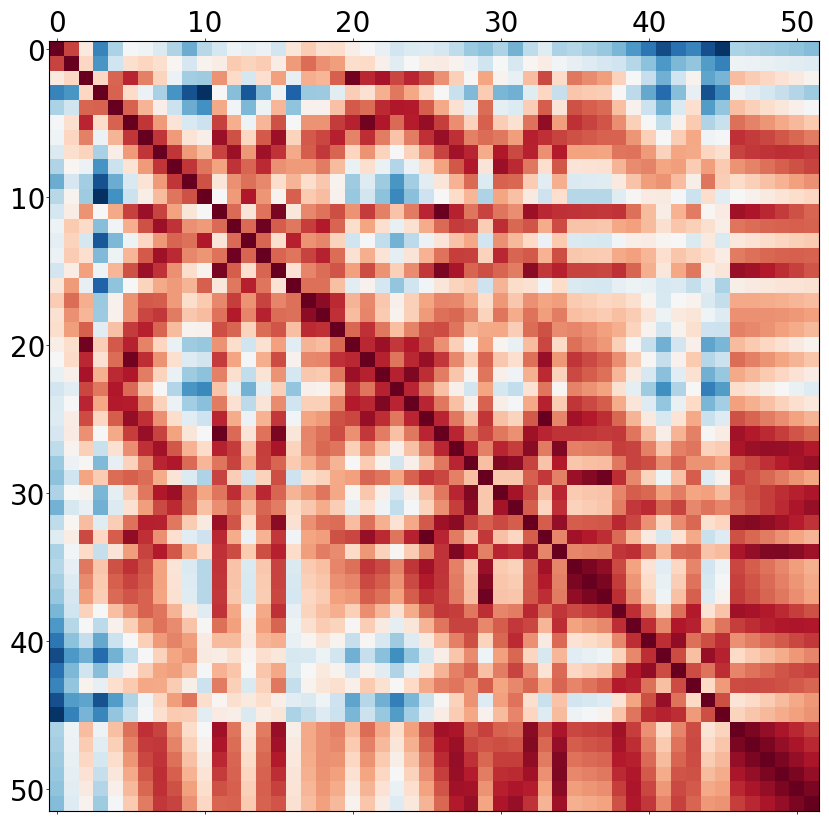

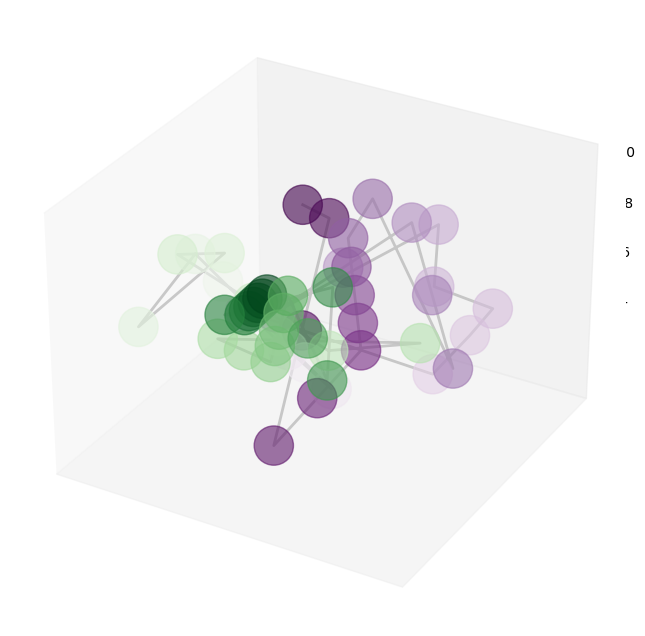

In [32]:
cell_no = 3
label = y[cell_no]
print(label)
# if single_map is a numpy array of shape (n,3)
import pandas as pd
single_map = xyzfilt[cell_no]   # your array
# create DataFrame with expected column names for downstream functions
original = pd.DataFrame(single_map, columns=['X(nm)', 'Y(nm)', 'Z(nm)'])

# Now call the function using the DataFrame
dm = get_distance_matrix(original)
plot_distance_matrix(dm, cmap_order="forward", ax_label=None)

# For 3D plotting, create a df with lowercase names (plot_in_3d expects 'x','y','z')
original_for_3d = pd.DataFrame(single_map, columns=['x','y','z'])
plot_in_3d(original_for_3d, point_size=800)

### Inference:
- Cell number 3 is selected and check whether it is positive or negative AbdA
- The 3D chromatin coordinates from xyzfilt is extracted next
- This is then placed as a DataFrame
- Pair-wise Euclidean distance matrix is then computed for single call
- This heatmap indicates that chromatin here is highly strcutured even it is non-transcribed cell(0) having multiple folded domains and open domains

# Perform NMF

### How is NMF Functioning here?
- NMF will take 52×52 distance map as input and convert it to a vector of length 2704.
- NMF will split the matrix to H(weights) and W(patterns) matrices
- W corresponds to how pattern appears in the cells
- The ChromaFactor again reconstructs the matrix
- The reconstruction error(Original-Reconstructed) will tell how much noise the NMF has removed

### Map normalization

In [33]:
xyzdat, rnadat = read_data(dna_file, rna_file) # read in data
xyzdat = fill_in_missing(xyzdat)               # fill in missing points with nas
xyzfilt, rnafilt = filter_dat(xyzdat, rnadat, req_xyz_perc = 0.2, interpol=True, norm = False, bool_thresh = 1)

In [34]:
# This code ensures that both DataFrames and NumPy arrays, detects any version of x/y/z column names
#Safe override of get_distance_matrix for notebook use#
import numpy as np
import pandas as pd
from scipy.spatial import distance

def get_distance_matrix(cellF):
    """
    Return pairwise Euclidean distance matrix from 3D coords.
    Works with:
      - pandas DataFrame with columns 'X(nm)', 'Y(nm)', 'Z(nm)', OR
      - numpy array of shape (n,3).
    """
    if isinstance(cellF, pd.DataFrame):
        # handle DataFrame input
        cols = {c.lower(): c for c in cellF.columns}
        xname = cols.get('x(nm)', cols.get('x'))
        yname = cols.get('y(nm)', cols.get('y'))
        zname = cols.get('z(nm)', cols.get('z'))
        if xname and yname and zname:
            x = cellF[xname].to_numpy(dtype=float)
            y = cellF[yname].to_numpy(dtype=float)
            z = cellF[zname].to_numpy(dtype=float)
            coords = np.column_stack([x, y, z])
        else:
            arr = cellF.to_numpy(dtype=float)
            if arr.ndim == 2 and arr.shape[1] >= 3:
                coords = arr[:, :3]
            else:
                raise ValueError("DataFrame missing x,y,z columns.")
    else:
        # handle numpy array input
        coords = np.asarray(cellF, dtype=float)
        if coords.ndim != 2 or coords.shape[1] != 3:
            raise ValueError("Array input must be shape (n,3) for [x,y,z].")

    # compute Euclidean distances
    return distance.squareform(distance.pdist(coords, metric='euclidean'))
# ---------------------------------------------------------------- #


In [35]:
all_maps = np.asarray([get_distance_matrix(single_map) for single_map in xyzfilt])
normalized = (all_maps-np.min(all_maps))/(np.max(all_maps)-np.min(all_maps))
median_distance_map_combined = np.nanmedian(normalized, axis = 0)
contact_th = 500
contact_map_combined = np.sum(all_maps<contact_th, axis=0) / np.sum(np.isnan(all_maps)==False, axis=0)

### Inference:
- Distance matrix is computed
- These are normalized
- Median distance map is computed
- Combined contact map is computed


### Run

In [36]:
normalized.shape

(23641, 52, 52)

In [37]:
# Run ChromaFactor
chroma_factor = ChromaFactor(normalized)

### NMF is applied in this step

In [38]:
# Reconstruct maps
new_maps = chroma_factor.reconstruct_maps()

### Distance maps is rebuild from learned components(W x H)

In [39]:
# Measure reconstruction error
print(f"Reconstruction Error: {chroma_factor.reconstruction_err}")

Reconstruction Error: 34.42003042188691


### The error between original and newly reconstructed is approximately 34.42

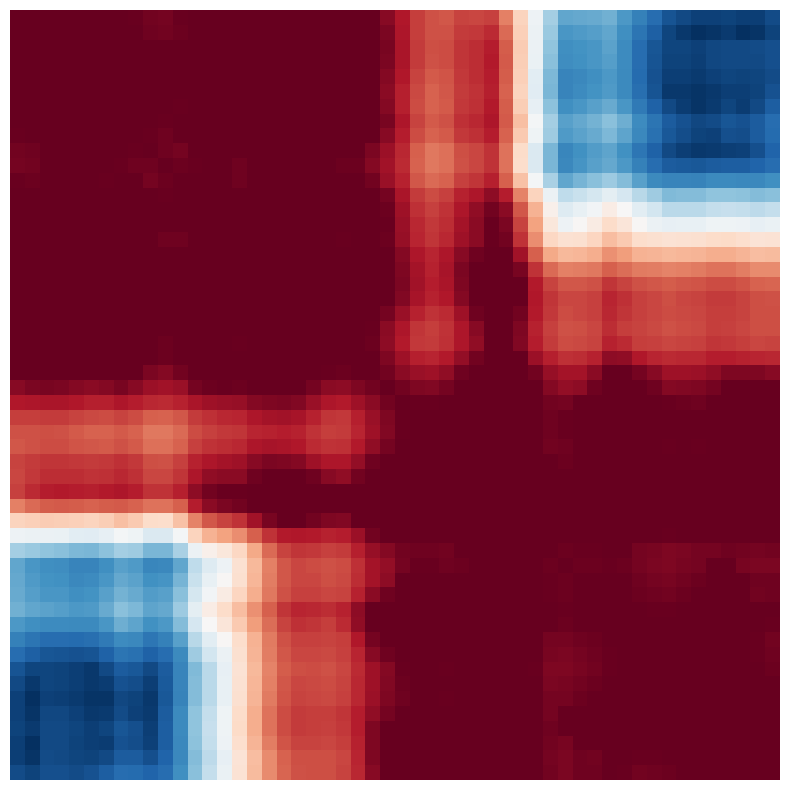

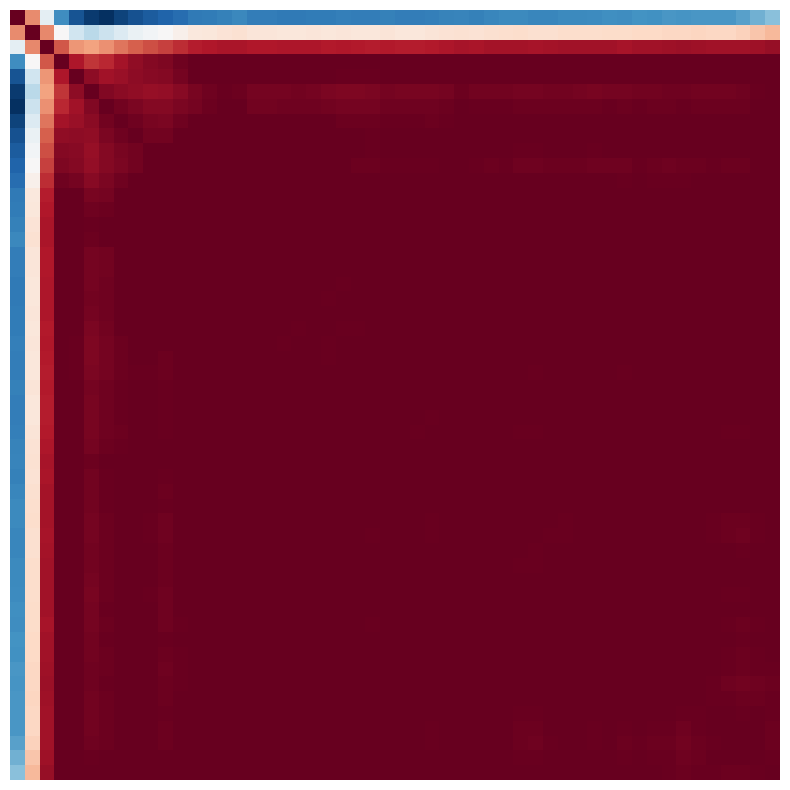

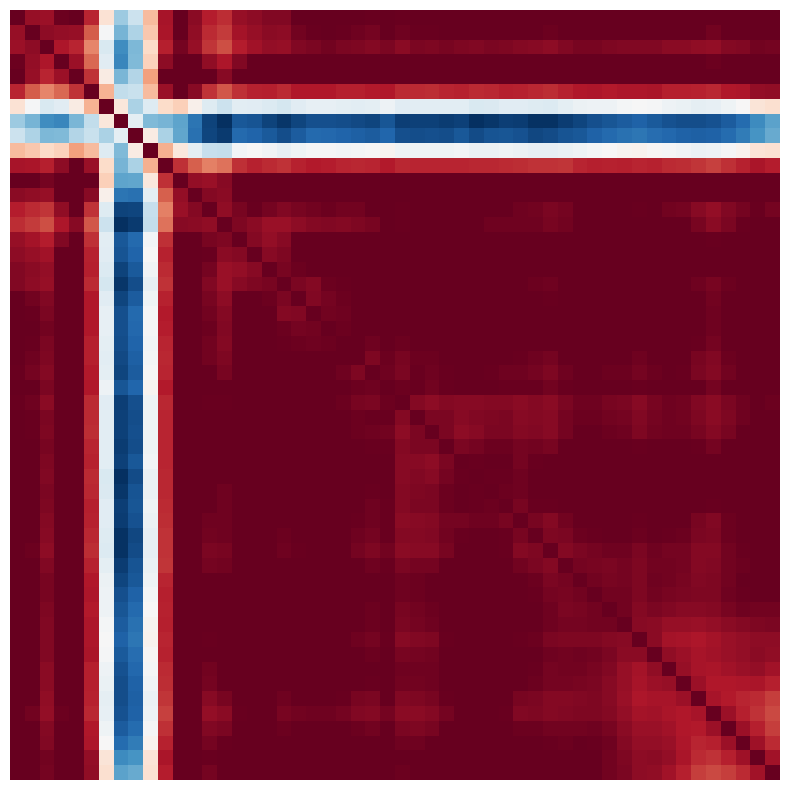

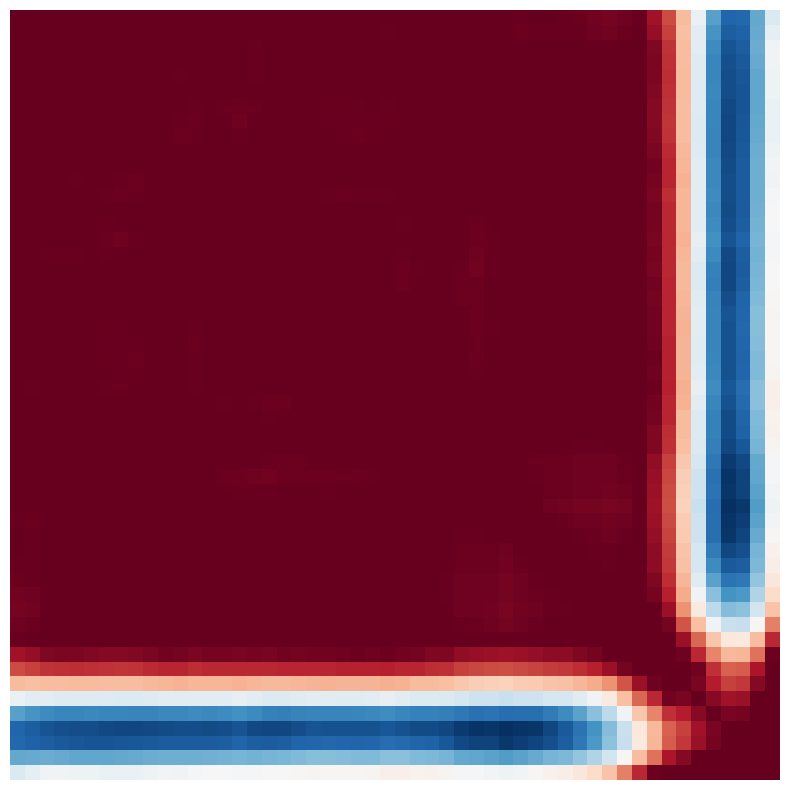

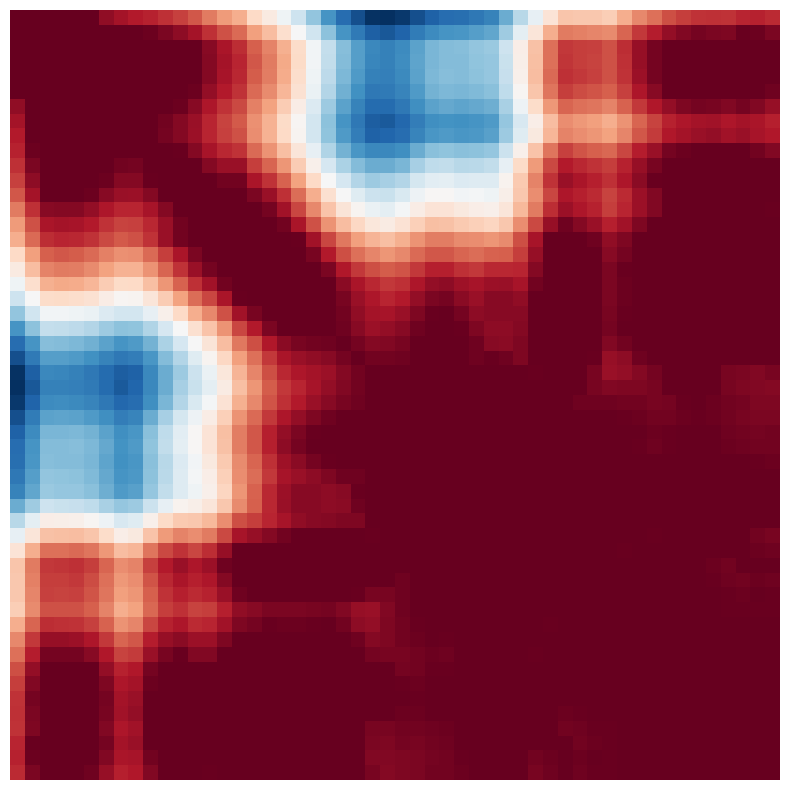

...

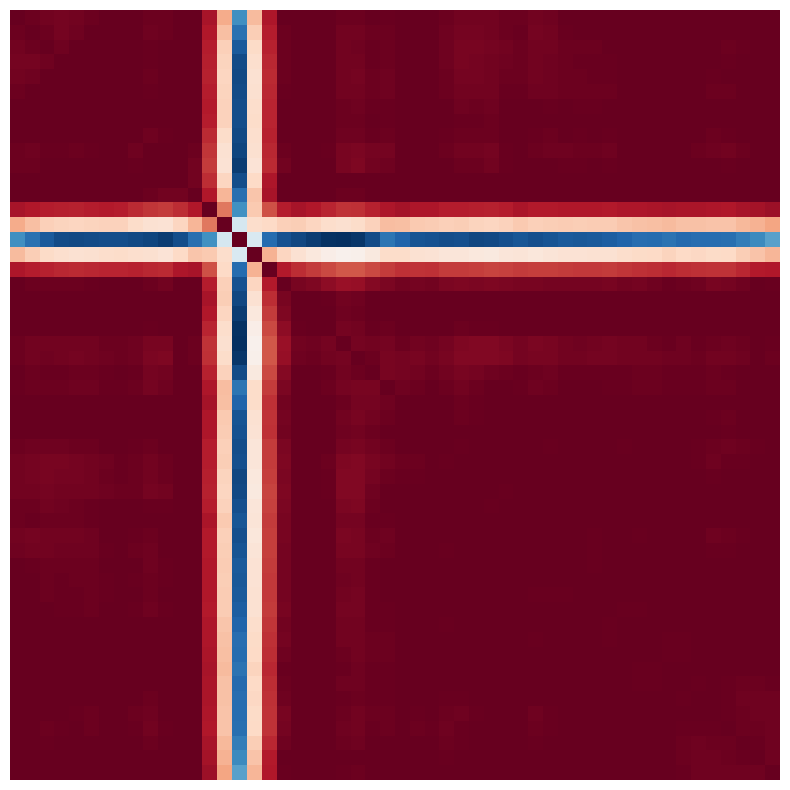

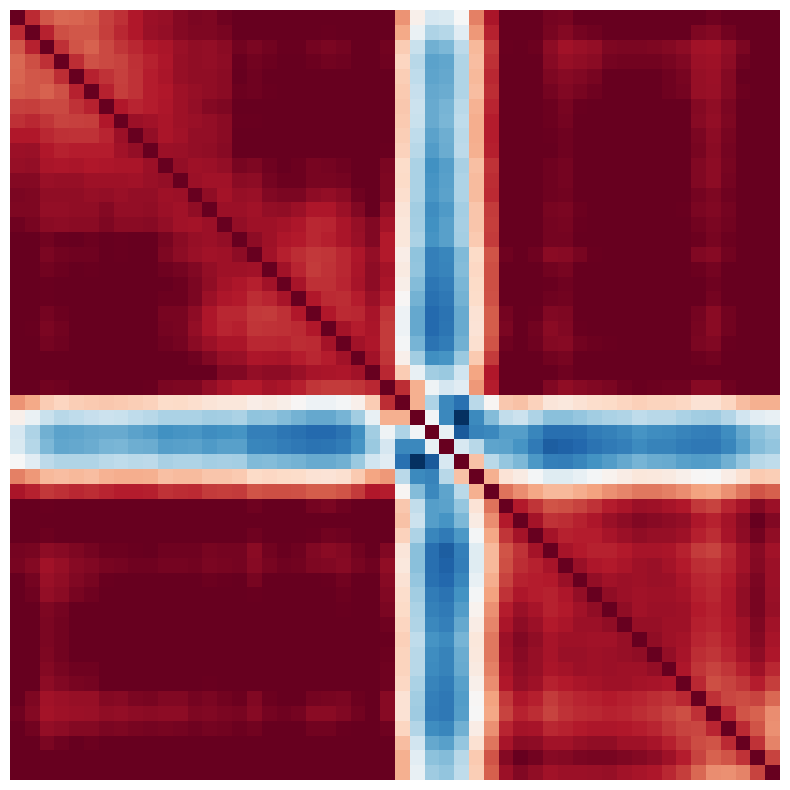

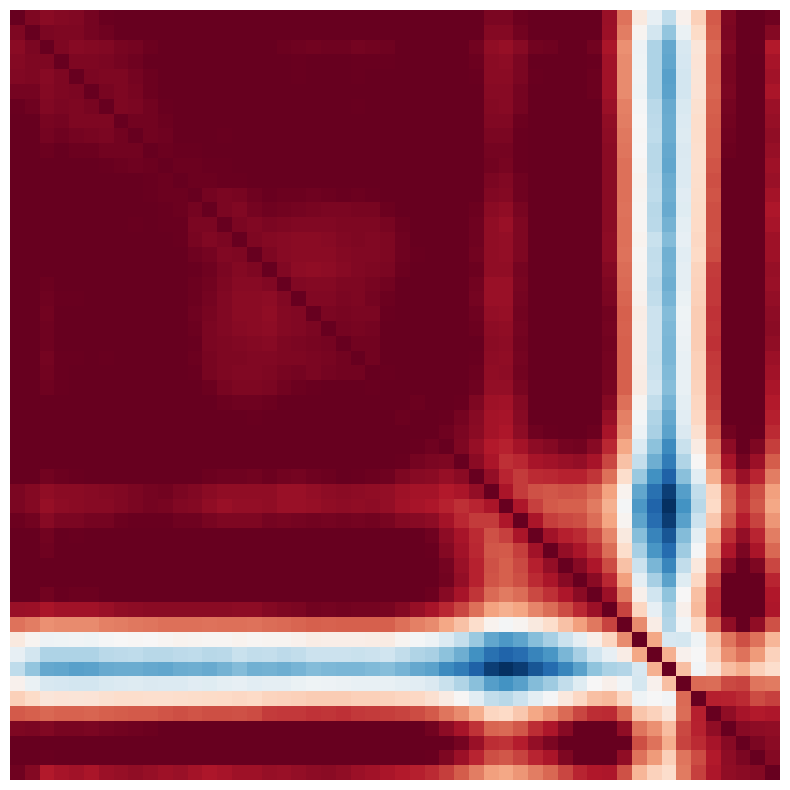

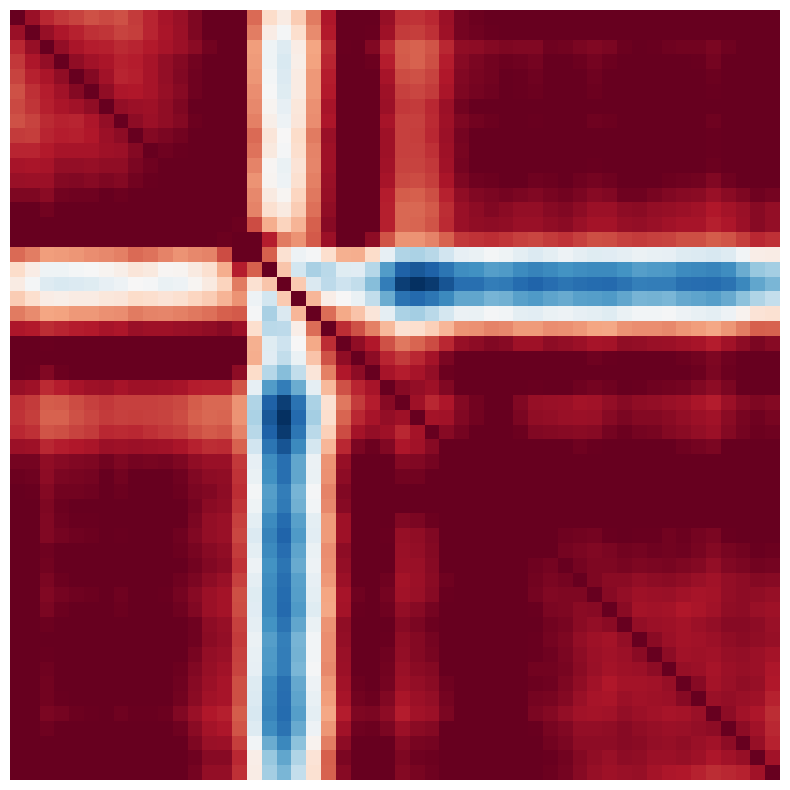

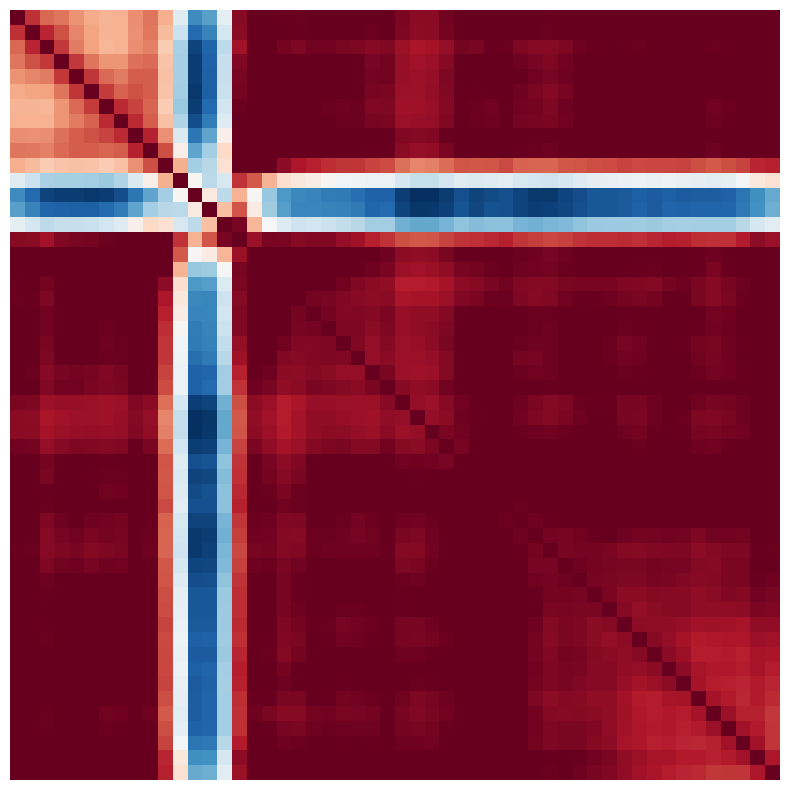

In [40]:
# Plot templates
chroma_factor.plot_nmf_maps()

- The maps represents the chromatin folding pattern in the dataset
- These maps are learned from all the cell distance matrices

<h1 style="color: blue;"> Figure 2: Single molecule examples

### Demonstrate umap of cells on factors.

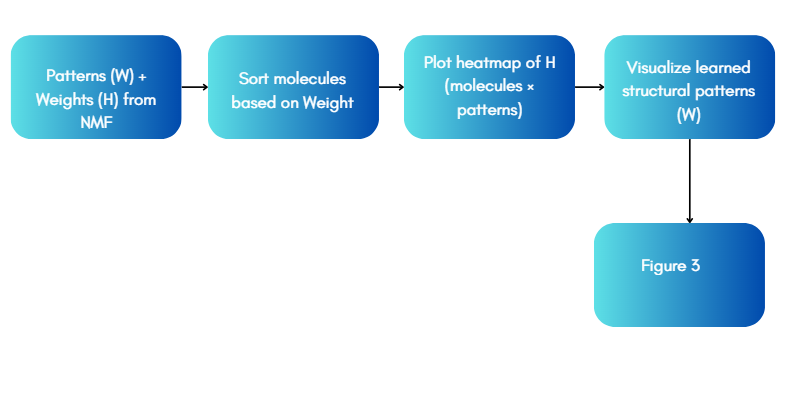

In [183]:
from IPython.display import Image, display
display(Image('Figure 2.png'))

In [41]:
import umap
import matplotlib as mpl
import seaborn as sns

In [42]:
data = chroma_factor.components.T #n x k matrix (k is learned templates)
componentsF = pd.DataFrame(data)
componentsF['primary_component'] = componentsF.idxmax(axis=1) #Takes highest W value

- Here weights(H matrix) are taken since UMAP should need cell-level features, W does not have cell-level features
- Transpose is taken since before it is k x n now it is n x k matrix
- Weight tells how much a particular NMF TEMPLATE contributes to that cell's structure

In [ ]:
components = chroma_factor.components #k x n matrix

## Plot median of closest component

### Component 0

component_maps shape: (39, 52, 52)
median shape: (52, 52)


<Figure size 600x600 with 0 Axes>

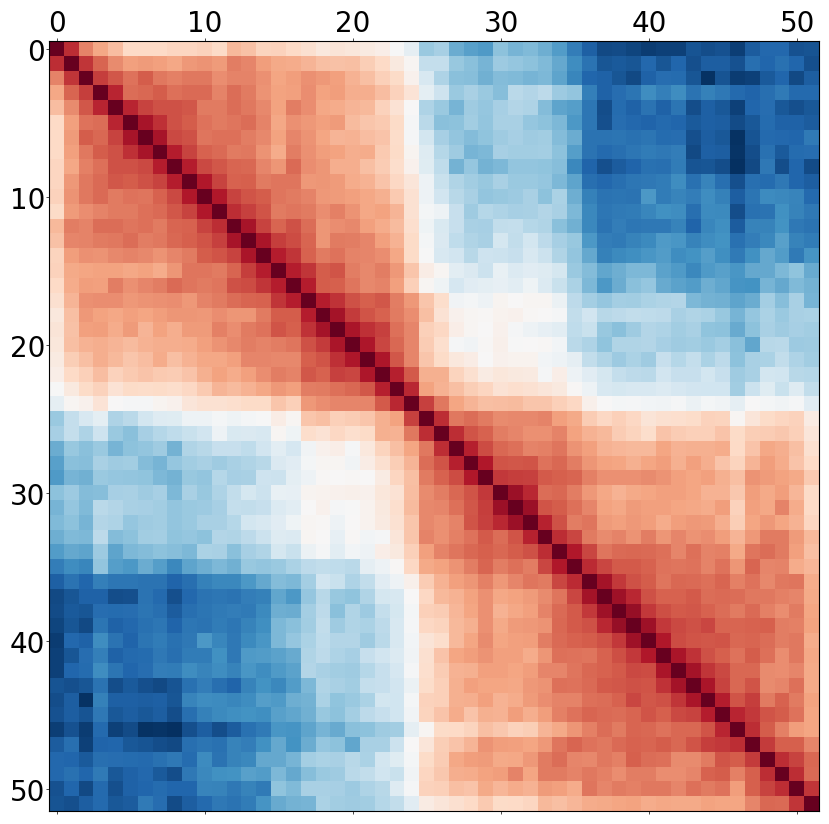

In [66]:
import matplotlib.pyplot as plt

mpl.rcParams['axes.spines.right'] = True
mpl.rcParams['axes.spines.top'] = True

cur_component = 0

# Select maps of this component
component_mask = componentsF['primary_component'] == cur_component
component_maps = all_maps[component_mask]
component_maps = np.asarray(component_maps)     # shape (n_samples, 52, 52)

print("component_maps shape:", component_maps.shape)

# Median map across samples
component_median = np.nanmedian(component_maps, axis=0)
print("median shape:", component_median.shape)

plt.figure(figsize=(6, 6))
plot_distance_matrix(
    component_median, 
    cmap_order='forward',
    ax_label=None
)
plt.show()    
#How will be the folding pattern for component 0 is seen 

-  NMF pattern 0
- The median across these 39 is 52 x 52 distance map
- Loci in 0 to 25 are close together, 30-50 are far apart, 25 to 30 is a domain boundary
- A stable structural partition occurs

### Component 1

component_maps shape: (261, 52, 52)
median shape: (52, 52)


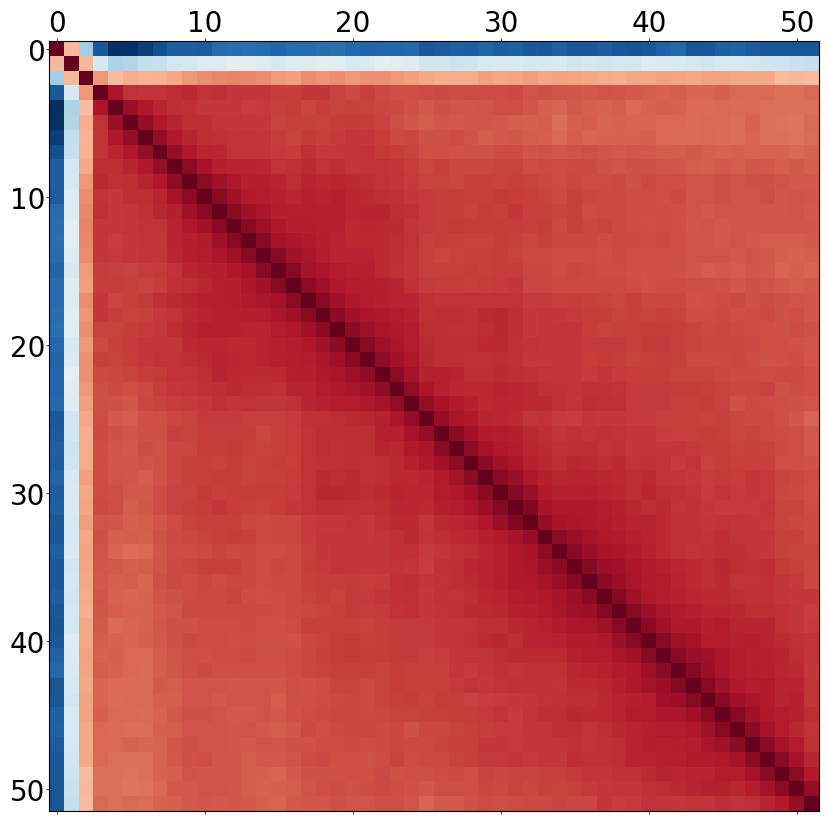

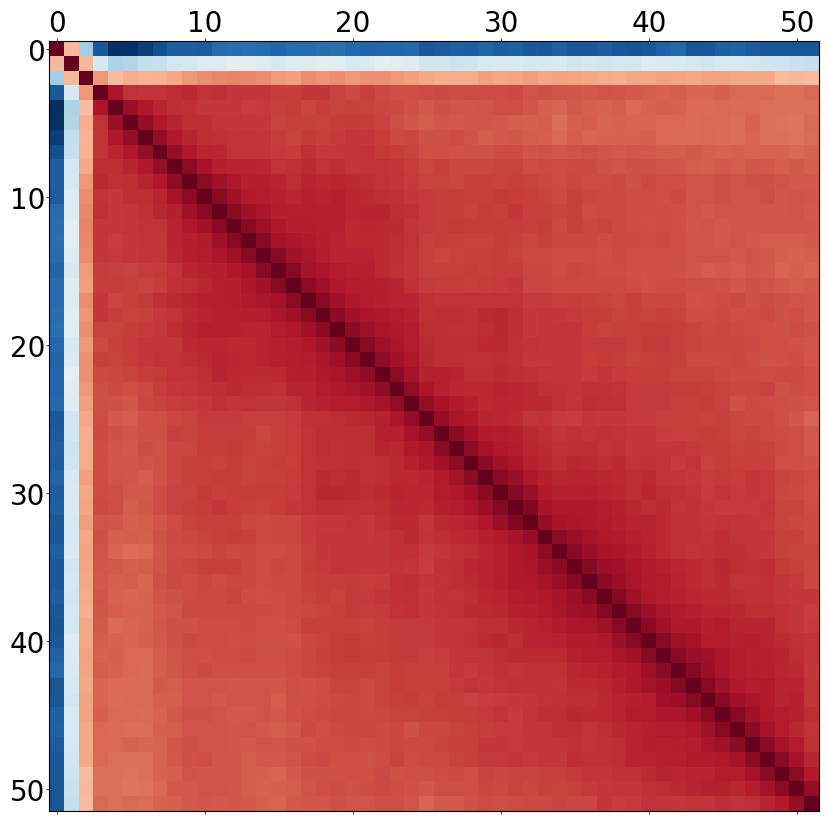

In [71]:
import matplotlib.pyplot as plt

mpl.rcParams['axes.spines.right'] = True
mpl.rcParams['axes.spines.top'] = True

cur_component = 1   # choose component

# 1. Select maps belonging to the component
component_mask = componentsF['primary_component'] == cur_component
component_maps = np.asarray(all_maps[component_mask])

print("component_maps shape:", component_maps.shape)

# 2. Compute median map
component_median = np.nanmedian(component_maps, axis=0)
print("median shape:", component_median.shape)

# 3. Plot ONE heatmap
plot_distance_matrix(component_median, cmap_order='forward', ax_label=None)
plt.show()      

- One NMF pattern is chosen and finds the cells which have majority that pattern, extracts 52 x 52 distance maps and computes mean 
- Majority red indicates that entire region is almost compact, only the very first loci are farther from rest

### Component 5

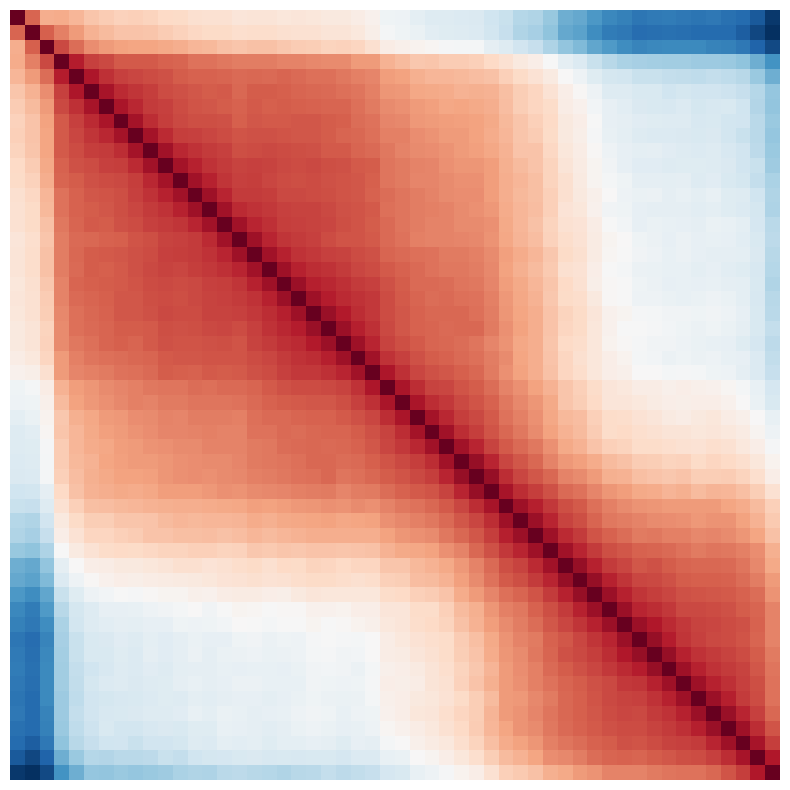

(1441, 52, 52)


In [86]:
cur_component = 5
component_mask = componentsF['primary_component'] == cur_component
component_maps = all_maps[component_mask]
component_maps_reshape = np.asarray([get_distance_matrix(single_map) for single_map in component_maps])
component_median = np.nanmedian(component_maps_reshape, axis = 0)
plot_distance_matrix(component_median, cmap_order='forward',hide_all=True, ax_label=None)
print(component_maps_reshape.shape)

- Cells assigned to component 5 is extracted and plots median 52 x 52 map
- The map shows that the structure is low-folding structural in nature sincethe  blue corners shows that the regions are far apart

In [73]:
fit = umap.UMAP(n_neighbors=5, random_state=42, metric='euclidean')
%time u = fit.fit_transform(data)

CPU times: total: 42.8 s
Wall time: 41.8 s


#### UMAP computation took ~42 seconds for reducing high-dimensional the NMF weights into 2D coordinates from 3D

In [74]:
umap_out = pd.DataFrame(u, columns=['umap1', 'umap2'])
umap_out['primary_component'] = componentsF['primary_component']

#### UMAP table, adds a label telling you which NMF pattern each cell belongs to, so that we can plot the UMAP colored by pattern

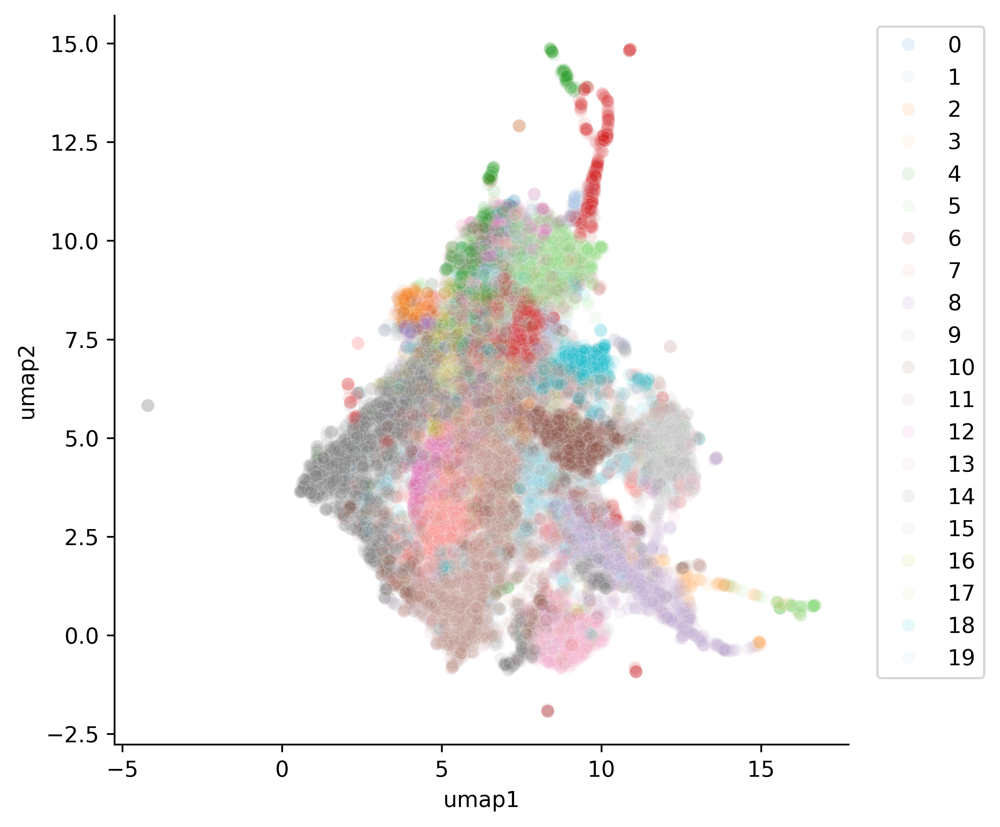

In [75]:
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False


fig = plt.figure(figsize = (6,6), dpi=600)

g = sns.scatterplot(data=umap_out, x = 'umap1', y = 'umap2',hue='primary_component', 
                palette='tab20', alpha= .1)
g.legend(bbox_to_anchor= (1.2,1))

plt.show()

- The UMAP coordinates are taken for all cells and plotted in 2D
- Color indicates the primary NMF component
- Distinct clusters denote that the cells get naturally grouped on the basis of shared structural patterns

## Single cell example

### Cell 1

In [78]:
cur_component = 0
componentF = pd.DataFrame(components.T)
componentF.sort_values(by=[cur_component],ascending=False).head(100)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
258,2.041467,0.138038,0.000000,0.000000,3.689995,0.000000,1.704784,0.000000,0.585363,0.000000,0.000000,0.000000,0.601995,0.000000,0.015555,0.423997,0.000000,0.000000,1.064537,0.437360
3259,1.569356,0.108098,0.001639,0.000000,2.887692,0.000000,1.336668,0.000000,0.460908,0.000000,0.000000,0.000000,0.486864,0.000000,0.000000,0.325449,0.000000,0.000000,0.817803,0.346687
16319,1.552021,0.119254,0.014914,0.000000,3.026306,0.000000,1.461115,0.000000,0.514832,0.000845,0.000000,0.042997,0.297051,0.000000,0.000000,0.345060,0.000000,0.000000,0.786429,0.350990
10685,1.291520,0.083470,0.000000,0.000000,2.284275,0.064117,1.041715,0.000000,0.353869,0.000000,0.067805,0.000000,0.453135,0.017431,0.011463,0.256891,0.000000,0.000000,0.667576,0.268654
9496,1.284913,0.034756,0.000000,1.594487,0.000000,4.051540,0.000000,0.124727,0.000000,0.481060,0.000000,0.000000,1.162205,0.094608,0.000000,0.000000,0.000000,0.393391,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10736,0.153116,0.011312,0.001405,0.010988,0.286450,0.004877,0.138001,0.017512,0.047898,0.013250,0.000000,0.001224,0.044609,0.009798,0.001232,0.030784,0.019153,0.000702,0.076598,0.032524
21254,0.152933,0.017410,0.005535,0.019555,0.357200,0.017200,0.193806,0.008288,0.072406,0.015950,0.037908,0.036701,0.059052,0.031159,0.030191,0.034471,0.016756,0.008636,0.062243,0.029680
9062,0.152176,0.005116,0.002346,0.285178,0.000000,0.596735,0.008248,0.033202,0.007162,0.098411,0.000000,0.047111,0.088272,0.000000,0.000000,0.022995,0.005507,0.094909,0.000000,0.004125
13022,0.151613,0.002123,0.012570,0.112414,0.064047,0.307740,0.016114,0.000000,0.000000,0.033821,0.000000,0.024499,0.128503,0.008960,0.025451,0.013784,0.000000,0.021272,0.060922,0.022522


- Here each row is cell and column is pattern
- These numbers indicates how strongly the cells represent patterns
- For eg we can see component 0 is more dominant in 258,3259,16319 etc

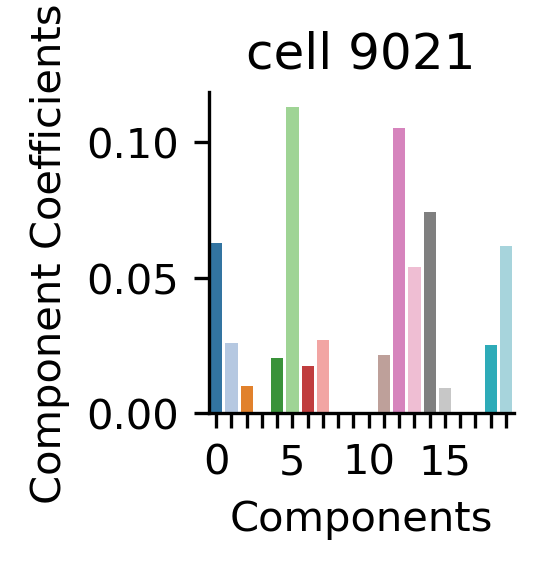

In [82]:

import matplotlib.pyplot as plt
import seaborn as sns

cell_no = 9021

plt.figure(figsize=(2,2), dpi=300)

feature_imp = componentF.loc[cell_no]

ax = sns.barplot(
    x=feature_imp.index,
    y=feature_imp,
    palette="tab20"       
)                         

# Reduce x-labels for readability
for i, t in enumerate(ax.get_xticklabels()):
    if (i % 5) != 0:
        t.set_visible(False)

plt.xlabel('Components')
plt.ylabel('Component Coefficients')
plt.title(f"cell {cell_no}")
plt.tight_layout()
plt.show()


- Specific cell is selected and here component coefficients are extracted
- This will tell how much each of the NMF structural pattern is contributing to the 3D genome organization of that cell
- A bar plot is generated where each bar corrsponds to each component, y-axis is the weight of the component in the cell
- If bars are taller this means that it gives dominant structural pattern for the cell

In [83]:
%run -i "C:/Users/athir//Maths Project Nov/fish_preprocessing.py"

In [84]:
# --- Notebook-local safe override of get_distance_matrix ---
# Place this cell immediately after the %run -i "…/fish_preprocessing.py" cell
import numpy as np
import pandas as pd
from scipy.spatial import distance

def get_distance_matrix(cellF):
    """
    Notebook-local replacement: accepts a pandas DataFrame (with 'X(nm)','Y(nm)','Z(nm)'
    or 'x','y','z' columns) OR a numpy array of shape (n,3). Returns (n,n) Euclidean distances.
    """
    # DataFrame path (robust to column name casing)
    if isinstance(cellF, pd.DataFrame):
        cols = {c.lower(): c for c in cellF.columns}
        xname = cols.get('x(nm)', cols.get('x'))
        yname = cols.get('y(nm)', cols.get('y'))
        zname = cols.get('z(nm)', cols.get('z'))
        if xname and yname and zname:
            x = cellF[xname].to_numpy(dtype=float)
            y = cellF[yname].to_numpy(dtype=float)
            z = cellF[zname].to_numpy(dtype=float)
            coords = np.column_stack([x, y, z])
        else:
            # fallback: try first three columns
            arr = cellF.to_numpy(dtype=float)
            if arr.ndim == 2 and arr.shape[1] >= 3:
                coords = arr[:, :3]
            else:
                raise ValueError("DataFrame missing x,y,z columns; cannot build coordinates.")
    else:
        # Numpy-like array path
        coords = np.asarray(cellF, dtype=float)
        if coords.ndim != 2 or coords.shape[1] != 3:
            raise ValueError("Array input must have shape (n,3) for [x,y,z].")
    # return pairwise Euclidean distance matrix
    return distance.squareform(distance.pdist(coords, metric='euclidean'))
# ----------------------------------------------------------------


<Figure size 640x480 with 0 Axes>

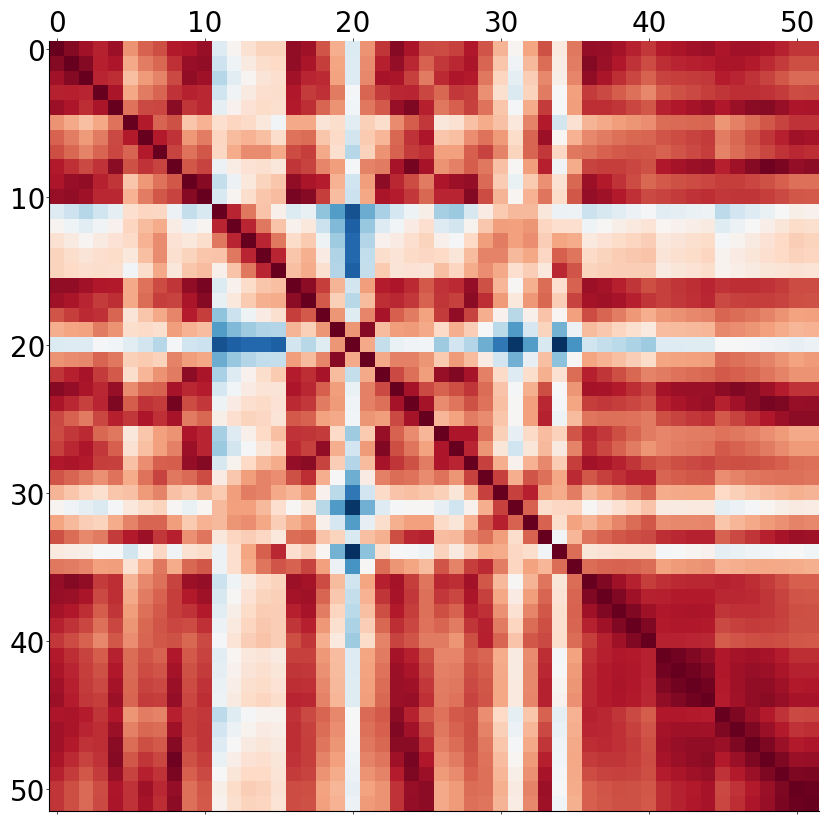

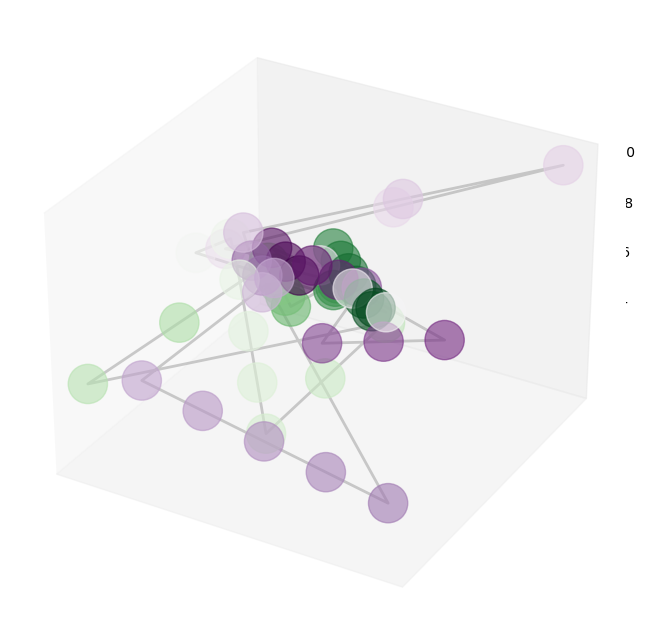

In [85]:
cell_no = 3
single_map = xyzfilt[cell_no]
ex_map = get_distance_matrix(single_map)

# Create DataFrame for plotting
original = pd.DataFrame(single_map, columns=['x', 'y', 'z'])

# Create dummy DataFrame with 'mid' column for normalize_map()
cellF_temp = pd.DataFrame({
    'X(nm)': single_map[:, 0],
    'Y(nm)': single_map[:, 1],
    'Z(nm)': single_map[:, 2],
    'mid': np.arange(len(single_map))
})

# Normalize
normalized = normalize_map(get_distance_matrix(single_map), cellF_temp, plot_maps=False)

# Plot
plot_distance_matrix(get_distance_matrix(single_map), cmap_order="forward",
                     ax_label=None)
plot_in_3d(original, point_size=800)


- Here one specific cell (cell 3) is selected and its 3D pairwise distance map is computed , normalizes it, and visualizes it
- This visualization gives a comparison how it looks before NMF

<h1 style="color: blue;"> Figure 3: Random Forest and Transcription

### Load data and apply ChromaFactor

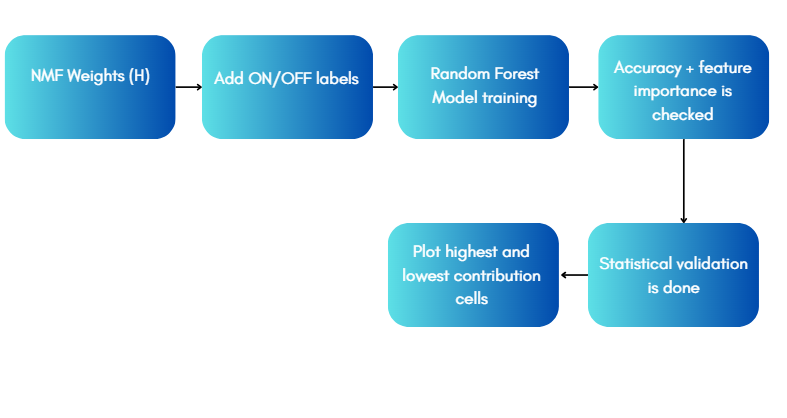

In [185]:
from IPython.display import Image, display
display(Image('Figure 3.png'))

In [86]:
from file_utils import *  

In [87]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
import matplotlib.pyplot as plt
import matplotlib as mpl

# Random Forest

In [88]:
# Define the list of RNA names
rna_list = [
    "AbdB_Main_Exon", "AbdB_Short_Exon", "AbdA_Exon", "Ubx_Exon", "Antp_Exon",
    "Scr_Exon", "Dfd_Exon", "pb_Exon", "lab_Exon", "Iab4_ncGene",
    "bxd_ncGene", "inv_Exon", "en_Whole_Gene", "ftz_Whole_Gene",
    "zen_Whole_Gene", "Ama_Whole_Gene", "sna_Whole_Gene", "elav_Exon",
    "AbdB_Main_Intron", "AbdB_Short_Intron", "AbdA_Intron", "Ubx_Intron",
    "Antp_Intron", "Scr_intron", "Dfd_Intron", "pb_Intron", "lab_Intron",
    "inv_Intron", "elav_Intron"
]

- Random Forest classifier is being trained for predicting whether each gene is transcriptionally active or not based on the structure of cell

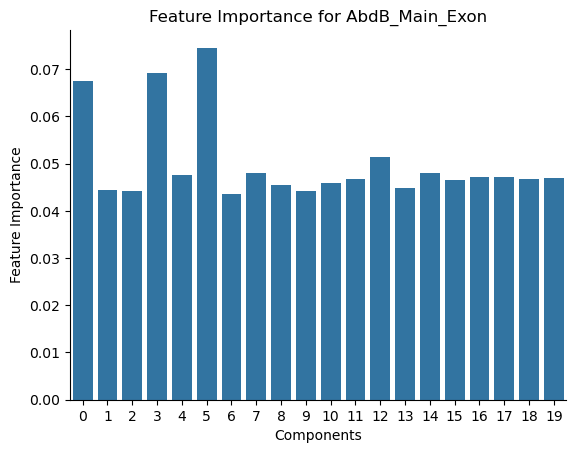

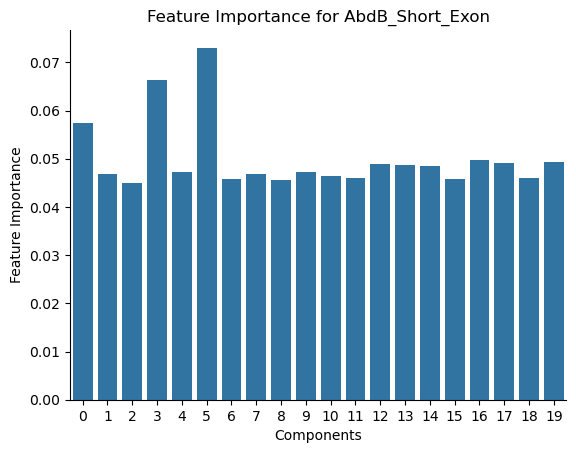

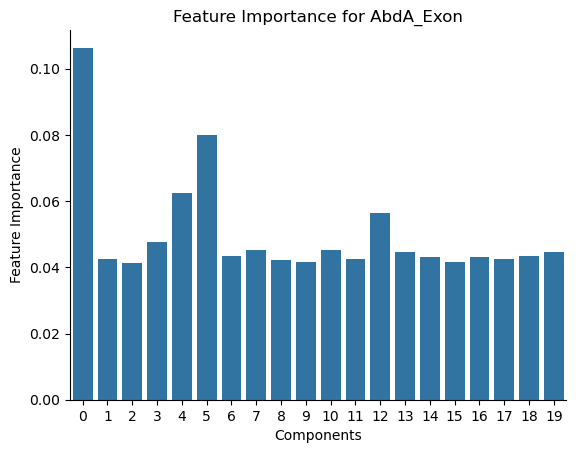

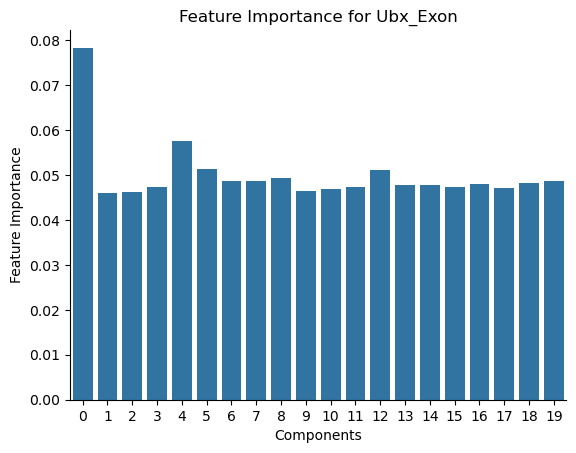

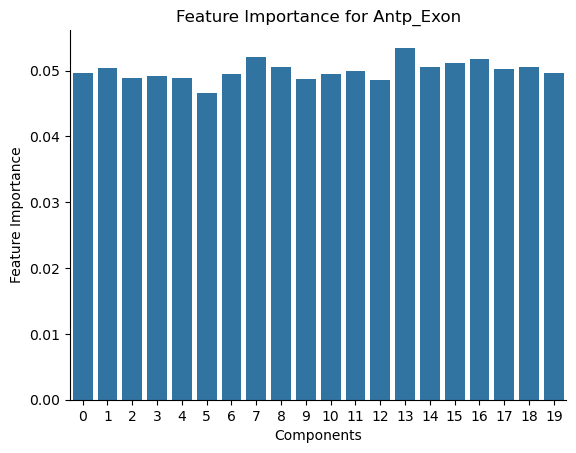

...

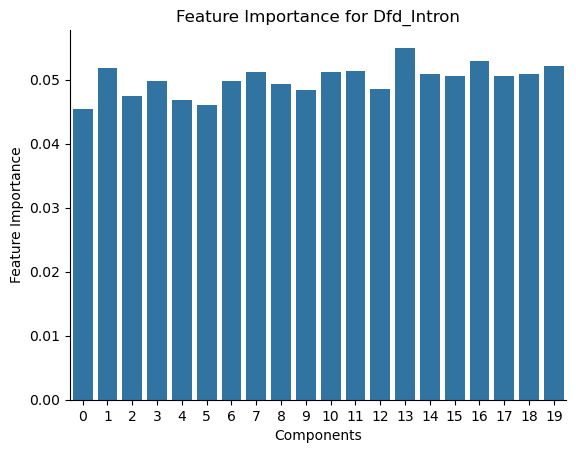

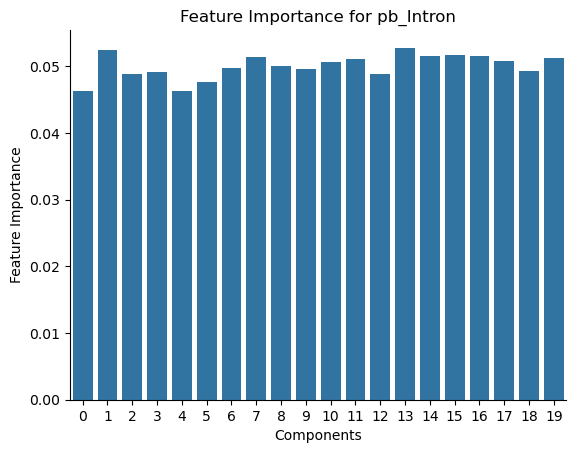

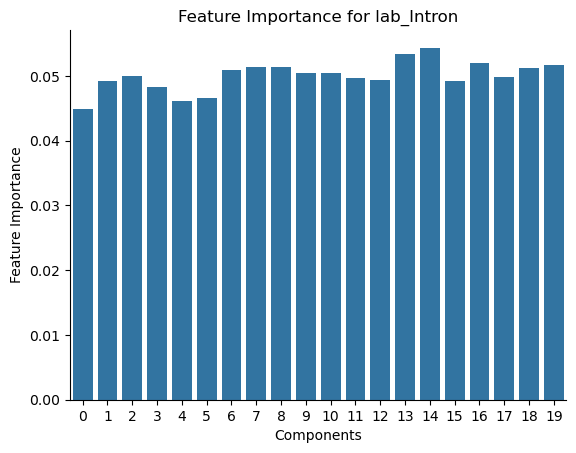

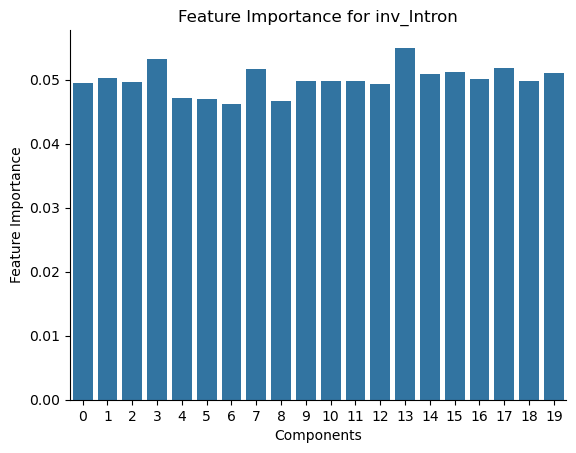

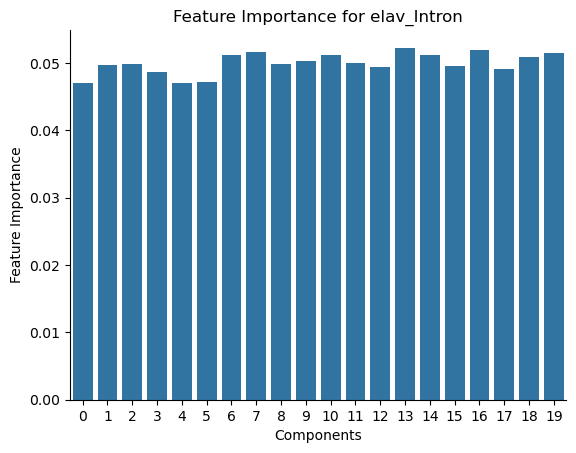

In [89]:
# Convert components to a DataFrame
component_df = pd.DataFrame(components.T)

# Create a mapping from RNA names to indices
rna_to_index = {rna: idx for idx, rna in enumerate(rna_list)}
index_to_rna = {idx: rna for idx, rna in enumerate(rna_list)}

# Initialize lists to store results
rna_results = []
examples_count = []
accuracy_scores = []
oob_scores = []
feature_importance_figures = []


# Loop through all RNAs
for rna_no, rna_name in enumerate(rna_list): #loop over all the RNA DATASET
    X = components.T 
    y = rnafilt.T[rna_no] #RNA EXPRESSION
    X, y = balanced_subsample(X, y)

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

    # Normalize the training and testing data
    train_mean = np.mean(X_train)
    train_std = np.std(X_train)
    X_train = (X_train - train_mean) / train_std
    X_test = (X_test - train_mean) / train_std

    # Calculate the balance ratio
    balance = max(np.sum(y) / len(y), 1 - np.sum(y) / len(y))

    # Initialize the classifier
    clf = RandomForestClassifier(n_estimators=100, oob_score=True)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Collect results
    rna_results.append(rna_name)
    examples_count.append(X_train.shape[0])
    accuracy_scores.append(metrics.accuracy_score(y_test, y_pred))
    oob_scores.append(clf.oob_score_)

    # Plot feature importance
    feature_imp = pd.Series(clf.feature_importances_).sort_values(ascending=False)
    sns.barplot(x=feature_imp.index, y=feature_imp)
    plt.xlabel('Components')
    plt.ylabel('Feature Importance')
    plt.title(f"Feature Importance for {rna_name}")
    plt.legend().remove()  # Remove legend if not necessary
    plt.show()

### Inference:
- First the component matrix is converted to a DataFrame, each row then become cell and each column will be structural factor
- For each RNA gene, a binary expression label is assigned for all of the cells
- This creates equal number of positive and negative cells
- This is further split to test and train
- NMF Factors are then normalized and Random Forest Classifier is trained for predicting whether gene will be ON or OFF on the basis of chromatin structure factors
- A feature importance bar plot is produced for each gene where a bar is an NMF factor, if the bar is tall it means it strongly influences whether gene is transcribed or not

# Performance

In [90]:
feature_imp = pd.Series(accuracy_scores,
                  index=rna_list).sort_values(ascending=False)
# Here each RNA gene is matched with the Random Forest classification accuracy and sorts genes from best to worst
# It helps to get the inference on how well NMF componenets can predict the gene's transcription

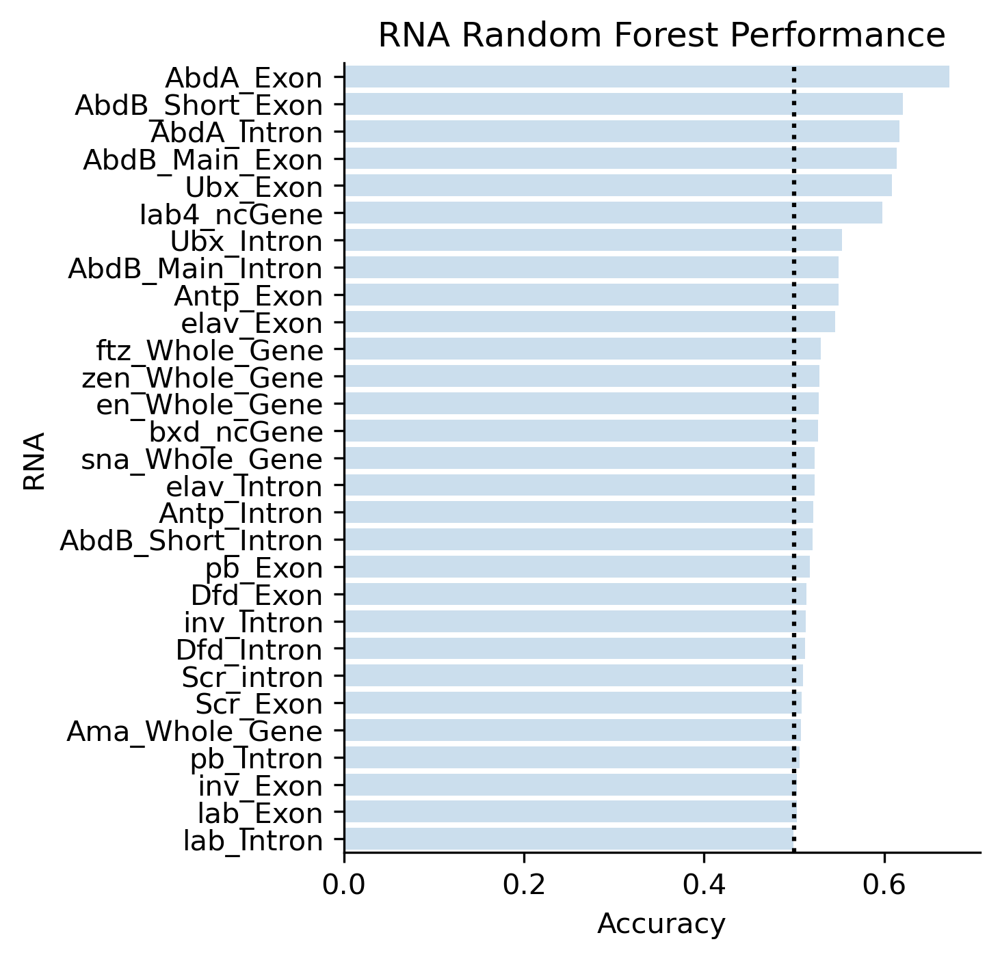

In [91]:
import matplotlib.pyplot as plt
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

plt.figure(figsize=(4,5), dpi=300)

feature_imp = pd.Series(accuracy_scores,
                        index=rna_list).sort_values(ascending=False)

sns.barplot(y=feature_imp.index, x = feature_imp, 
            #palette="coolwarm_r",
            color = '#C5DFF3',
            orientation='horizontal')
plt.axvline(x=0.5, color='black', linestyle=':')
plt.xlabel('Accuracy')
plt.ylabel('RNA')
plt.title("RNA Random Forest Performance")
plt.show()

##### Inference: 
- This is a plot to show the Random Forest performance.
- RNA gene is represented by one bar.
- There is a dashed line at 0.5 it indicates that it is random guessing,beyond that,
  the chromatin structure will contain actual biological information about the gene.
- From this plot we can see AbdA genes has the maximum accuracy which denotes the strong link between the
  transcription and chromatin structure

# Feature importance

In [92]:
rna_no = rna_to_index['AbdA_Exon']
X = components.T
y = rnafilt.T[rna_no]
X, y = balanced_subsample(X,y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3) 

# normalize
train_mean = np.mean(X_train)
train_std = np.std(X_train)
X_train = (X_train - train_mean) / train_std
X_test = (X_test - train_mean) / train_std


balance = max(np.sum(y)/len(y), 1-np.sum(y)/len(y))

clf=RandomForestClassifier(n_estimators=100, oob_score=True)
clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)

print(f"RNA: {rna_no}")
print(f"Training Examples: {X_train.shape[0]}")
print("Accuracy:",round(metrics.accuracy_score(y_test, y_pred),4))
print("oob:",round(clf.oob_score_, 4))
print("balance:",round(balance, 4))
print("-------------")

RNA: 2
Training Examples: 7502
Accuracy: 0.6748
oob: 0.6654
balance: 0.5
-------------


##### Interpretation:
- Here Random Forest classifier is used to predict whether the gene AbdA_Exon is ON or OFF from the NMF components.
- We are getting an accuracy of around 0.67 which means the model correctly predicts the state of ON/OFF almost 67% time
- oob score denotes that it is not overfitting and model is stable
- The dataset here is balanced on 50% ON and 50% OFF
- Training examples 7502 means, these much are used after balancing

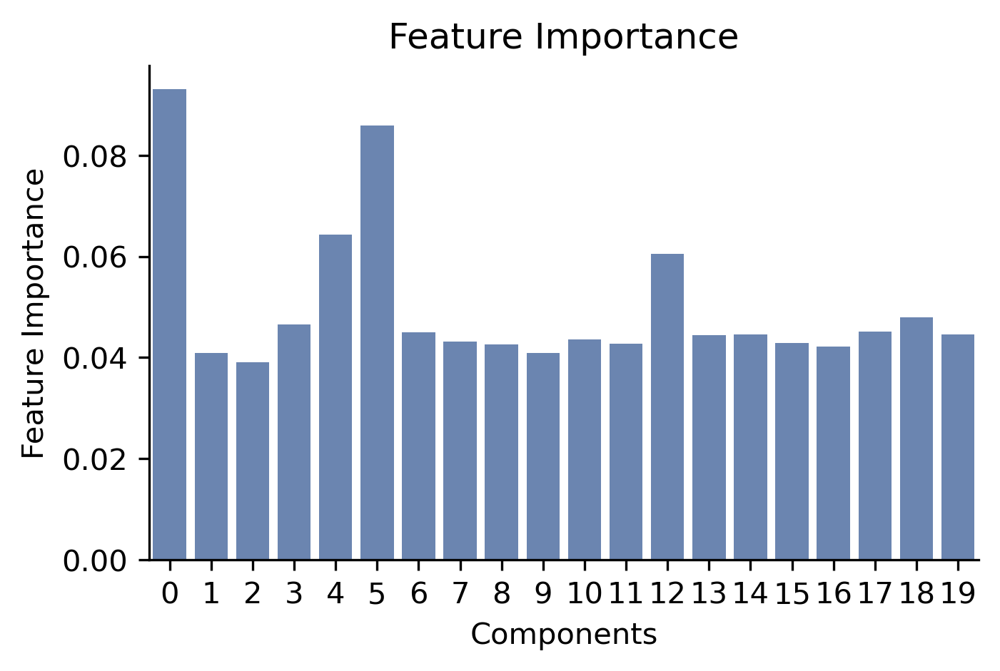

In [93]:
import matplotlib.pyplot as plt
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

plt.figure(figsize=(5,3), dpi=300)

feature_imp = pd.Series(clf.feature_importances_,index=list(range(components.shape[0]))).sort_values(ascending=False)

sns.barplot(x=feature_imp.index, y = feature_imp, color = '#5F83BB')

plt.xlabel('Components')
plt.ylabel('Feature Importance')
plt.title("Feature Importance")

plt.show()

- Here the plot visualizes the feature importance of the Random Forest model trained for prediction of AbdA_Exon gene
- There some components with high bars which indicates that these are AbdA associated chromatin state or they can best predict the transcription, the lower values indicates the components which are not related to AbdA

# Component significance

In [94]:
componentF = pd.DataFrame(components.T)

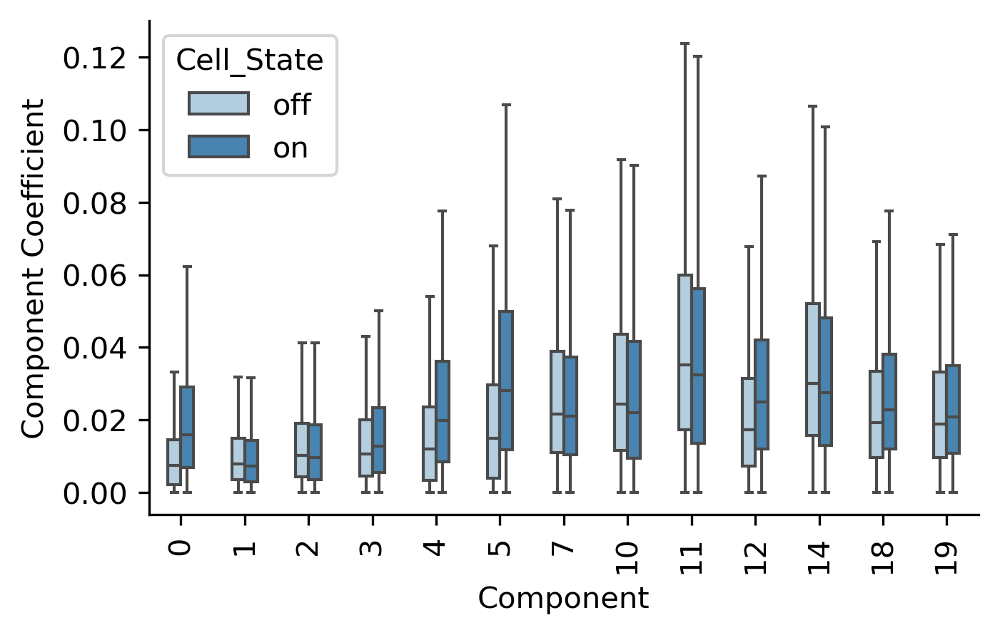

In [95]:
import matplotlib.pyplot as plt
alpha =.001 # significance threshold

X = components
y = rnafilt.T[rna_no]

df = componentF
df["Cell_State"] = y

import scipy.stats as stats

# # Threshold for significance
# alpha = 0.05/30

# List to hold significantly different components
significant_components = []
pvals = []

# Perform Manan-Whitney U test for each component
for component in df.columns[:-1]:  # Exclude the "Cell_State" column
    positive_values = df[df["Cell_State"] == 1][component]
    negative_values = df[df["Cell_State"] == 0][component]
    
    # Perform the test
    _, p_value = stats.mannwhitneyu(positive_values, negative_values, alternative='two-sided')

    # If the p-value is less than alpha, the difference is significant
    if p_value < alpha:
        significant_components.append(component)
        pvals.append(p_value)

# Filter the DataFrame to include only significant components
df_significant = df[significant_components + ["Cell_State"]]

# Convert DataFrame from wide to long format for easy plotting
df_melted = pd.melt(df_significant, id_vars="Cell_State", var_name="Component", value_name="Value")


df_melted['Cell_State'] = df_melted['Cell_State'].replace({0: 'off', 1: 'on'})

mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

plt.figure(figsize=(5,3), dpi=300)

# Create the boxplot
ax = sns.boxplot(data=df_melted, x="Component", y="Value", hue="Cell_State", showfliers=False,
                 width=0.4,
             palette="Blues")

plt.gcf().set_facecolor('none')

plt.xticks(rotation=90)  # Rotate x-axis labels if needed
plt.ylabel('Component Coefficient')
plt.show()

- This plot is used to see which of the components differs between the gene ON and OFF cells
- If there is strong separation that means it has structural differences
- Mann–Whitney U test, helps in selecting components whose coefficients has statistically significant changes with various transcription states
- In box plot the dark blue represents ON cels and light blue represents silent gene
- 10, 11, 12, 14, and 18 have significantly higher coefficients in the ON cells
- OFF cells have lower coefficients
- In 0 to 4 ON and OFF medians overlap slightly

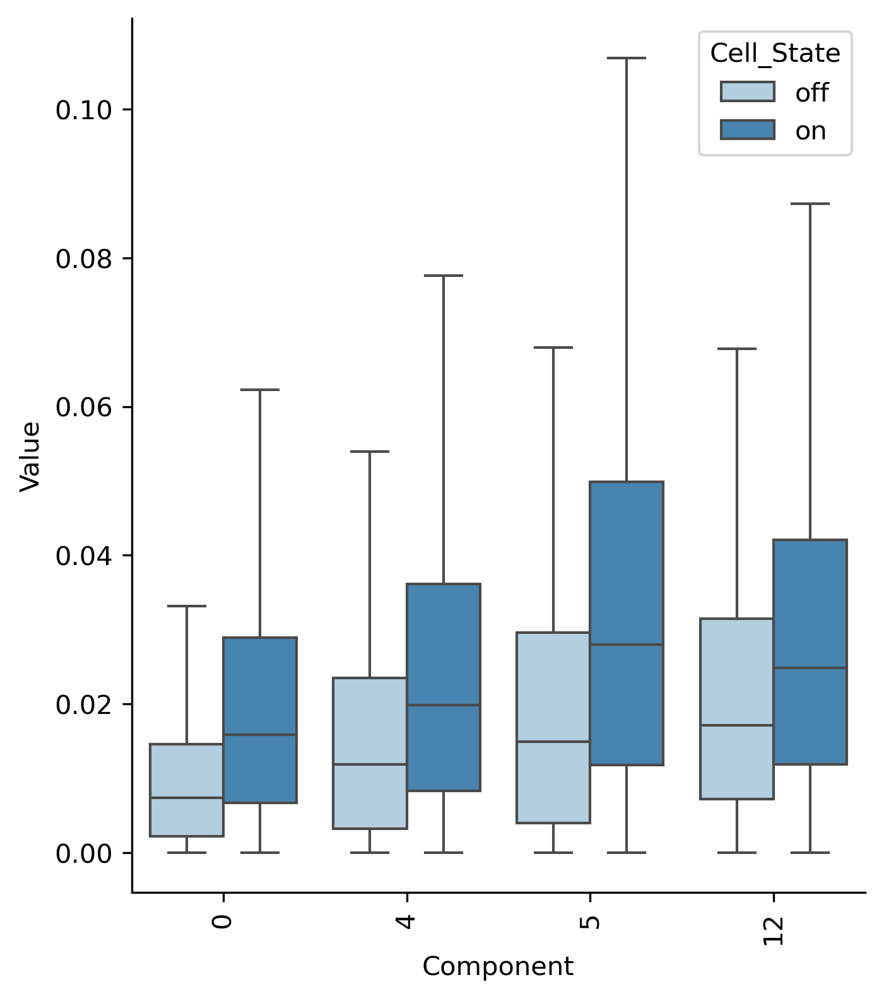

In [96]:
alpha = 0.00000000000000000000000000001 # significance threshold

X = components
y = rnafilt.T[rna_no]

df = componentF
df["Cell_State"] = y

import scipy.stats as stats
import matplotlib.pyplot as plt
# List to hold significantly different components
significant_components = []
pvals = []

# Perform Manan-Whitney U test for each component
for component in df.columns[:-1]:  # Exclude the "Cell_State" column
    positive_values = df[df["Cell_State"] == 1][component]
    negative_values = df[df["Cell_State"] == 0][component]
    
    # Perform the test
    _, p_value = stats.mannwhitneyu(positive_values, negative_values, alternative='two-sided')

    # If the p-value is less than alpha, the difference is significant
    if p_value < alpha:
        significant_components.append(component)
        pvals.append(p_value)

# Filter the DataFrame to include only significant components
df_significant = df[significant_components + ["Cell_State"]]

# Convert DataFrame from wide to long format for easy plotting
df_melted = pd.melt(df_significant, id_vars="Cell_State", var_name="Component", value_name="Value")


df_melted['Cell_State'] = df_melted['Cell_State'].replace({0: 'off', 1: 'on'})

mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

plt.figure(figsize=(5,6), dpi=300)

# Create the boxplot
ax = sns.boxplot(data=df_melted, x="Component", y="Value", hue="Cell_State", showfliers=False,
           palette="Blues")

plt.gcf().set_facecolor('none')

plt.xticks(rotation=90)  # Rotate x-axis labels if needed
plt.show()


- Here again Mann-Whitney U is used to check which NMF components differ significantly between the ON and OFF transcriptional states.
- It computes a p-value for each component
- If these p-values are below the threshold it is marked as different
- Only significant components are plotted as boxplots (those passed the test)
- 0, 4, 5, and 12 have higher median and these while transcription is ON are more active

## Color UMAP

In [97]:
print('componentF in workspace?', 'componentF' in globals())
if 'componentF' in globals():
    print("componentF shape:", componentF.shape)
    display(componentF.head())

componentF in workspace? True
componentF shape: (23641, 21)


,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Cell_State
0,0.012981,0.024872,0.000000,0.989198,0.045567,0.070174,0.000000,0.000000,0.000000,0.766870,...,0.000000,0.000000,0.044613,0.020857,0.006329,0.015287,0.391110,0.030856,0.010207,0
1,0.016242,0.007680,0.013096,0.000000,0.008659,0.006423,0.030864,0.012211,0.007378,0.006558,...,0.022285,0.016146,0.010910,0.034867,0.013131,0.008386,0.034981,0.007763,0.020047,0
2,0.013019,0.006407,0.012675,0.000000,0.011685,0.003590,0.027452,0.013301,0.007722,0.007463,...,0.020632,0.015257,0.010236,0.031510,0.014607,0.008264,0.038479,0.006752,0.020104,0
3,0.000000,0.001012,0.002813,0.007498,0.000000,0.012108,0.013016,0.034667,0.022372,0.006373,...,0.092356,0.047985,0.005072,0.079296,0.025103,0.023663,0.012309,0.041728,0.095202,0
4,0.007301,0.012249,0.002636,0.000000,0.003243,0.015041,0.017816,0.003730,0.004516,0.001463,...,0.035359,0.011205,0.004566,0.027144,0.002986,0.007672,0.014354,0.026680,0.015991,0


- This table represents the weights and how each ce;ll expresses the 21 patterns learned from the contact maps
- This is further used in UMAP clustering , significance testing etc.

In [98]:

import pandas as pd
import umap
from sklearn.preprocessing import StandardScaler

# 1) Standardize the factor matrix (optional but consistent)
scaler = StandardScaler()
X = scaler.fit_transform(componentF.values)

# 2) Compute UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
embedding = reducer.fit_transform(X)

# 3) Build the DataFrame
umap_df = pd.DataFrame(embedding, columns=["umap1", "umap2"])
umap_full = pd.concat([umap_df, componentF.reset_index(drop=True)], axis=1)

# 4) Save the CSV
umap_full.to_csv("umap_plot.csv", index=False)

print("Generated umap_plot.csv successfully!")
print("Shape:", umap_full.shape)

Generated umap_plot.csv successfully!
Shape: (23641, 23)


### Here NMF weights are standardized and UMAP is run for embedding all the 23641 cells to 2d space, the UMAP coordinates are merged with weights. The CSV file now contains UMAP coordinates and NMF components

In [99]:
umap = pd.read_csv('umap_plot.csv')
concatF = pd.concat([umap, componentF], axis=1)
concatF['hue'] = 'none'
neg_index = concatF[(concatF[0] < 0.009631) & (concatF[1] < 0.006144) & (concatF[5] < 0.006813) & (concatF[14] < 0.010290)].index
concatF.loc[neg_index,'hue'] = 'off'
pos_index = concatF[(concatF[0] > 0.009631) & (concatF[1] > 0.006144) & (concatF[5] > 0.006813) & (concatF[14] > 0.010290)].index
concatF.loc[pos_index,'hue'] = 'on'

- UMAP + NMF components are loaded and thresholds on selected components are applied
- The cells with high and low transcription signal is identified

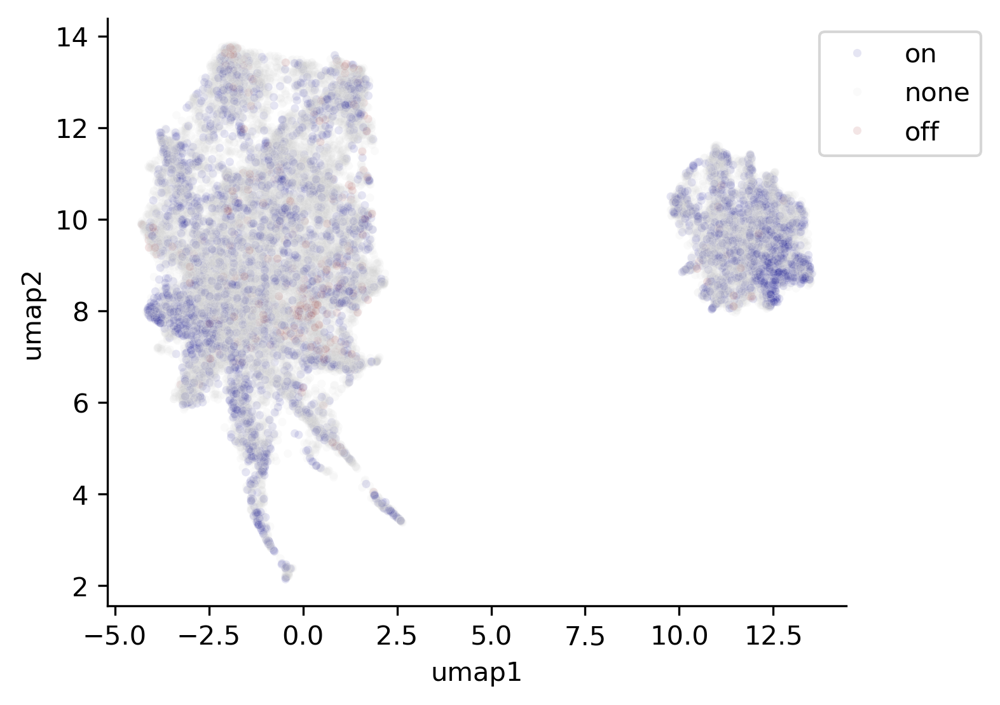

In [100]:
#Plotting UMAP groups with different colours
import matplotlib.pyplot as plt
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

plt.fig = plt.figure(figsize = (5,4), dpi=300)


palette = {'none': 'lightgrey', 'on': 'darkblue', 'off': 'darkred'}

g = sns.scatterplot(data=concatF, x = 'umap1', y = 'umap2',hue='hue', 
                palette=palette, alpha= .1, s=10)
g.legend(bbox_to_anchor= (1.2,1))


plt.show()

- Two clusters are appearing
- ON is represented by blue and red represents OFF
- The  clusters arise from the global chromatin structure differences
- Right cluster has more ON cells
- Left cluster cells share more similar chromatin pattern

## Plot highest and lowest contribution cells

In [101]:
mpl.rcParams['axes.spines.right'] = True
mpl.rcParams['axes.spines.top'] = True

### Off

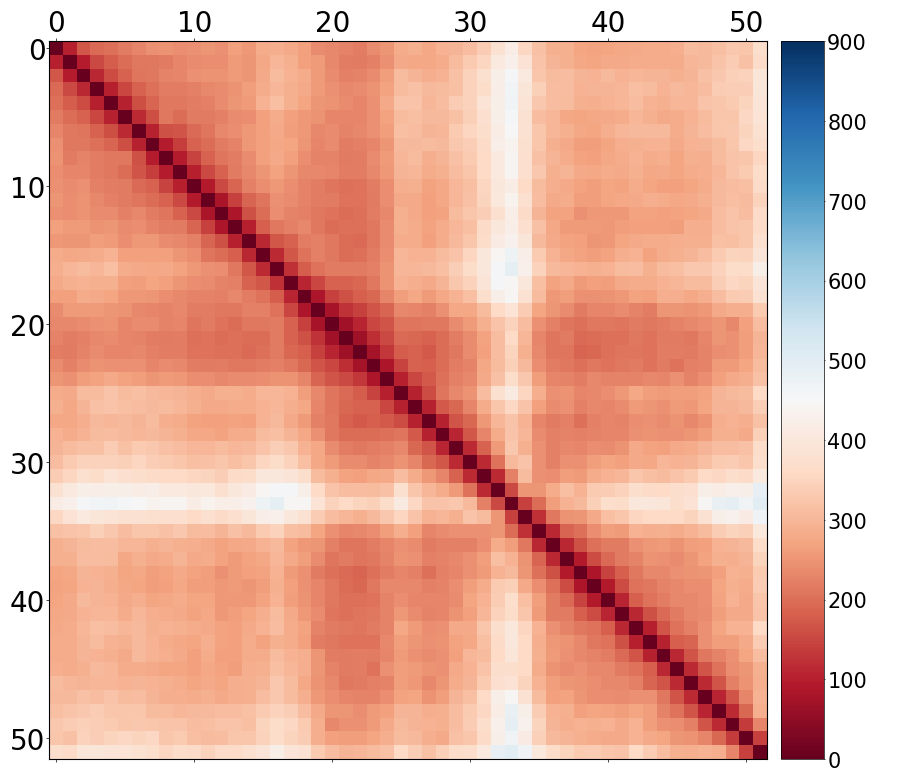

<Figure size 600x600 with 0 Axes>

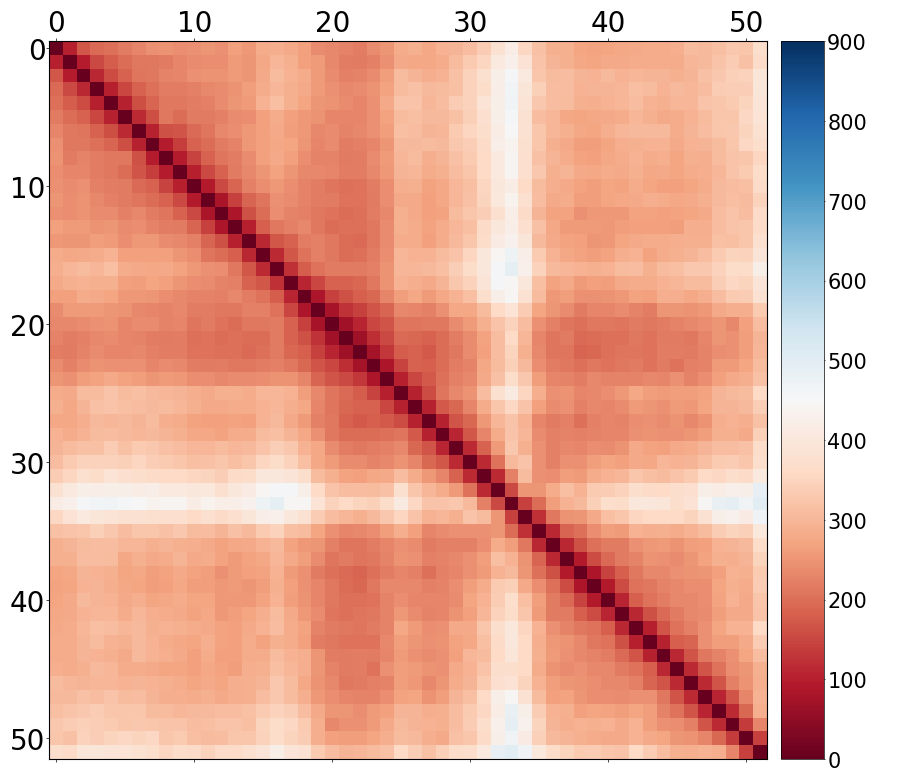

In [107]:
cur_component = 'off'
component_mask = concatF['hue'] == cur_component
component_maps = all_maps[component_mask]
component_maps_reshape_on = np.asarray(component_maps) 
neg_component_median = np.nanmedian(component_maps_reshape_on, axis = 0)
plt.figure(figsize=(6, 6))
plot_distance_matrix(neg_component_median, cmap_order='forward', ax_label=None,
                                                         vmax = 900,
                                                            colorbar_labels=' ')
plt.show()


### On 

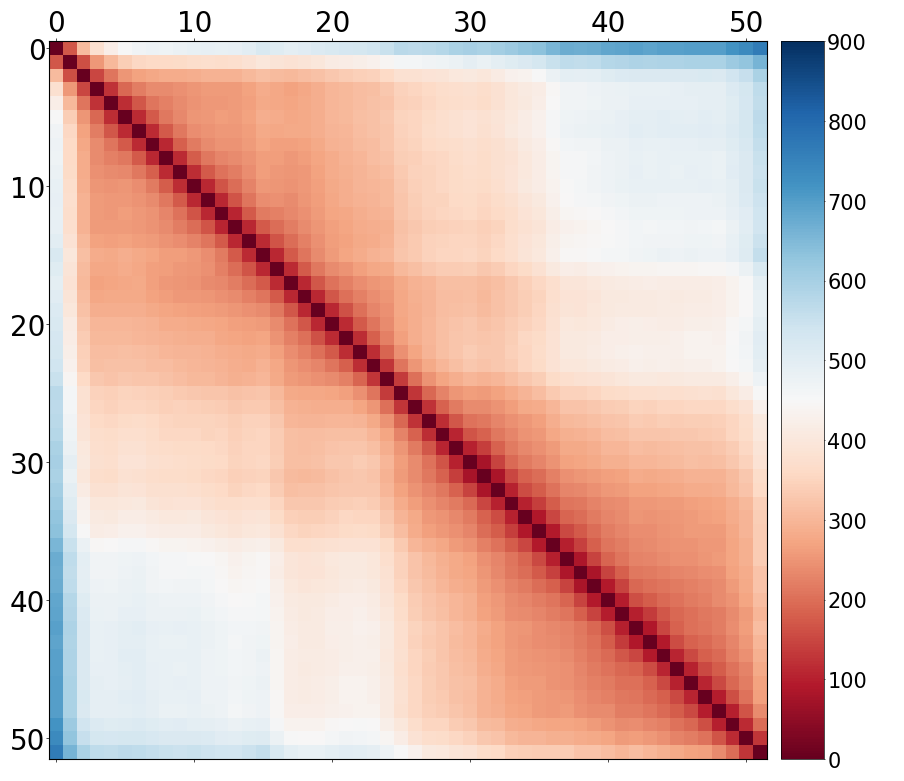

In [111]:
cur_component = 'on'
component_mask = concatF['hue'] == cur_component
component_maps = all_maps[component_mask]
component_maps_reshape_off = np.asarray(component_maps) 
pos_component_median = np.nanmedian(component_maps_reshape_off, axis = 0)
plot_distance_matrix(pos_component_median, cmap_order='forward', ax_label=None,
                                                                              vmax = 900,
                                                            colorbar_labels=' ')
plt.show()

- Plotted the heatmap for median 3D chromatin structure of all cells that have the component OFF and ON respectively
- It reveals how region pair is whether it is open or close, indicate the folding characteristics
- OFF cells have overall compact structure, but few areas are of open and also there is domain boundary and isolated regions
- In the ON cells, there is strong chromatin decondensation and it forms a distinct boundary, right half is open and left half is compact, the activation caused half open structure

<h1 style="color: blue;">Figure 4: ChromaFactor on Su et al. dataset

In [112]:
import warnings
warnings.filterwarnings("ignore")

In [113]:
# General
import pandas as pd
import numpy as np
import pickle
from tqdm import tqdm_notebook
import csv
import sys
import math
import tqdm
from math import floor

#Plotting
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.pyplot import figure
import seaborn as sns
from matplotlib import cm
import matplotlib as mpl

# scipy
from scipy.spatial import distance_matrix
from scipy.sparse import coo_matrix
import scipy.spatial.distance
from sklearn.model_selection import train_test_split

In [114]:
data_dir = "Maths Project Nov"
base_dir = "Maths Project Nov"
data_dir = "Maths Project Nov"

In [115]:
from genomic_annotation import *                   # Genomic annotation functions
from fish_preprocessing import *   

In [116]:
%run -i "C:/Users/athir/Maths Project Nov/fish_preprocessing.py"

In [117]:
chrom21 = pd.read_csv("chromosome21.tsv", sep="\t")
max_graph = max(chrom21['Chromosome copy number']) #Last molecule ID
min_graph = 1 #First chromosome copy ID 
idx_to_gene, gene_to_idx = return_gene_mapping(chrom21) #gene name are converted to numeric positions to be used further

##### Dataset details:
###### The columns are 3D positions, Genomic interval, gene name, transcription details and 3D coordinates of transcription start site

In [118]:
#Gene indexing mapping is done to convert gene name to numeric position

cur_gene = "HLCS"
cur_idx = gene_to_idx[cur_gene]
gene_no = cur_idx
cur_idx

27

## Establish window around gene 

In [120]:
#Converting back index to name for labelling

cell_number = 1
resolution = 40000
total_window = 10000000
cellF = pull_chrom(cell_number, chrom21) 
cur_gene = idx_to_gene[gene_no]
label = gene_no
cur_gene

'HLCS'

In [121]:
%run -i "C:/Users/athir/Maths Project Nov/su_preprocessing.py"

<Figure size 640x480 with 0 Axes>

In [122]:
positive_cells, negative_cells = get_cellids_by_transcription(max_graph,cur_idx,chrom21)
#Goes from 1 to maximum to check whether HLCS goes to ON or OFF

  0%|          | 0/7590 [00:00<?, ?it/s]

In [125]:
# Get gene position
gene_pos = get_gene_pos(cellF, cur_gene)  #3D position of the gene 
window_size = math.floor(total_window/2) #Genomic region that is being analyzed

# Number of positive and negative examples
print(len(positive_cells))
print(len(negative_cells))

positive_pull = positive_cells #Cells that are ON
negative_pull = negative_cells #Cells that are off

1171
6419


In [ ]:
# Build distance matrices around gene

In [126]:
# The local chromatin distance maps around gene HLCS is extracted for both ON and OFF cells

positive_matrices = []
negative_matrices = []
failures = 0
for cell_number in tqdm_notebook(positive_pull):
    try:
        cellF = pull_chrom(cell_number, chrom21)                                 # Grab map for cell
        gene_pos = get_gene_pos(cellF, cur_gene)                                 # Get gene position
        start_loc, end_loc = gene_pos - window_size, gene_pos + window_size      # boundary start and stop locations 
        dummy = subset_by_window(cellF, start_loc, end_loc)
        distance_matrix = get_distance_matrix(dummy)

        positive_matrices.append(distance_matrix)
    except:
        failures += 1
print(failures)

failures = 0
for cell_number in tqdm_notebook(negative_pull):
    try:
        cellF = pull_chrom(cell_number, chrom21)                                 # Grab map for cell
        gene_pos = get_gene_pos(cellF, cur_gene)                                 # Get gene position
        start_loc, end_loc = gene_pos - window_size, gene_pos + window_size      # boundary start and stop locations 
        dummy = subset_by_window(cellF, start_loc, end_loc)
        distance_matrix = get_distance_matrix(dummy)

        negative_matrices.append(distance_matrix)
    except:
        failures += 1
print(failures)

  0%|          | 0/1171 [00:00<?, ?it/s]

0


  0%|          | 0/6419 [00:00<?, ?it/s]

0


# Plot maps

### Normalize maps and get median

In [131]:
#This block of code computes median distance maps, normalized maps and contact maps

# grab dummy
cellF = pull_chrom(cell_number, chrom21)     

# across all cells for one gene
gene_pos = get_gene_pos(cellF, cur_gene)                                 # Get gene position
window_size = math.floor(total_window/2)
start_loc, end_loc = gene_pos - window_size, gene_pos + window_size      # boundary start and stop locations 

# subset postive and negative 
dummy = subset_by_window(cellF, start_loc, end_loc)

positives = np.asarray(positive_matrices)
negatives = np.asarray(negative_matrices)

positive_median = np.nanmedian(positives, axis = 0)
negative_median = np.nanmedian(negatives, axis = 0)
sub_median =  positive_median - negative_median

normed_positive = distance_normalize_map(positive_median, dummy)
normed_negative = distance_normalize_map(negative_median, dummy)
sub_normed = normed_positive - normed_negative

contact_th = 500
positive_thresh = np.sum(positives<contact_th, axis=0) / np.sum(np.isnan(positives)==False, axis=0)
negative_thresh = np.sum(negatives<contact_th, axis=0) / np.sum(np.isnan(negatives)==False, axis=0)
sub_thresh = positive_thresh - negative_thresh

positive_normalized = normalize_map(positive_thresh,dummy)
negative_normalized = normalize_map(negative_thresh,dummy)
sub_normalized = positive_normalized - negative_normalized

## Plot positive median

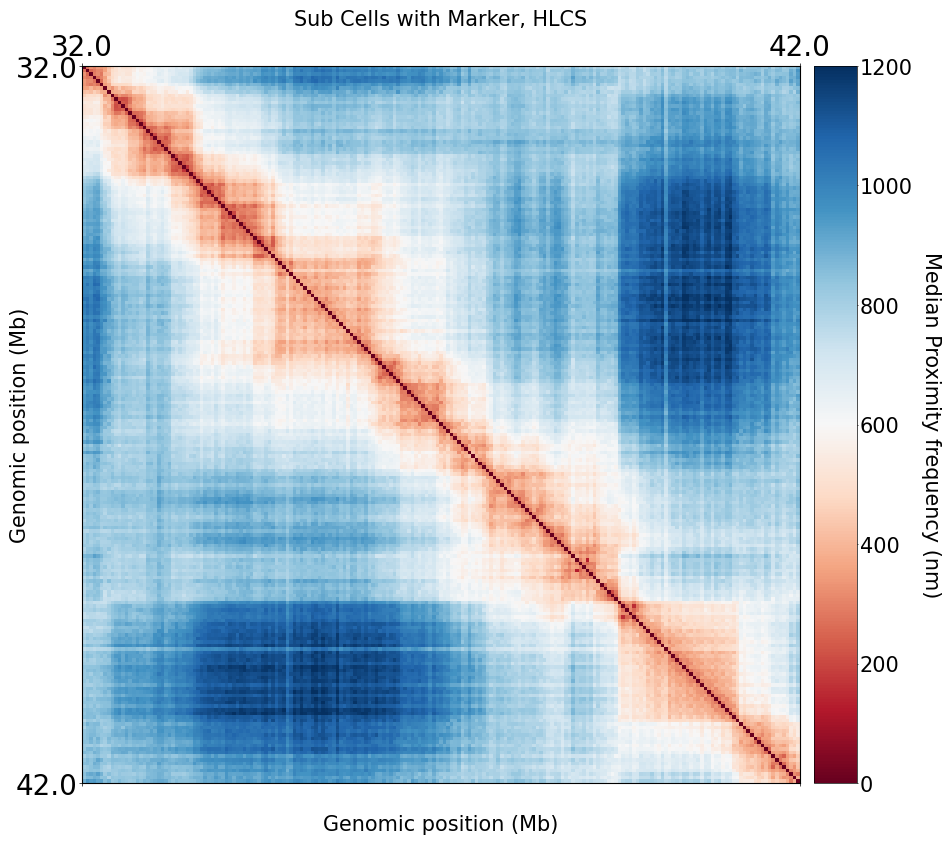

In [135]:
#Plotting the average 3D distance structure around HLCS for ON state
plot_distance_matrix(positive_median, cmap_order="forward", 
                     map_color = "green",
                     tick_positions = [start_loc, end_loc],
                     colorbar_labels='Median Proximity frequency (nm)',
                     midpoint_normalize=False,
                     vmax=1200,
                     title= "Sub Cells with Marker, " + cur_gene)
plt.show()

- The heatmap reveals an open configuration since mostly blue area is there and red diagonal indicates that locally it is still compact
- So when the gene is ON chromatin adopts a more open form

## Plot negative median

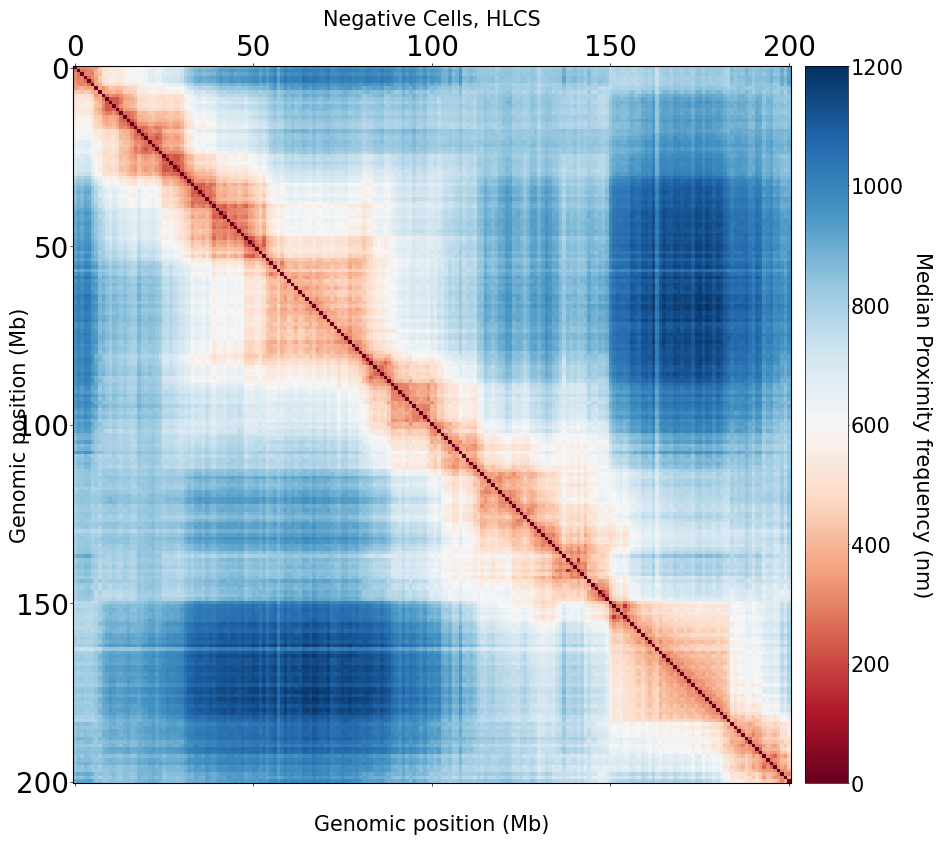

In [136]:

plot_distance_matrix(negative_median, cmap_order="forward", title= "Negative Cells, " + cur_gene, 
                                          colorbar_labels='Median Proximity frequency (nm)',
                                          vmax=1200,
                    )
plt.show()

- When the gene is off, the local chromatin seems to be compact. 
- The areas which are far apart can be seen in blue area, which indicates that different regions separates more strongly when the gene is off.

### Plot difference between two maps

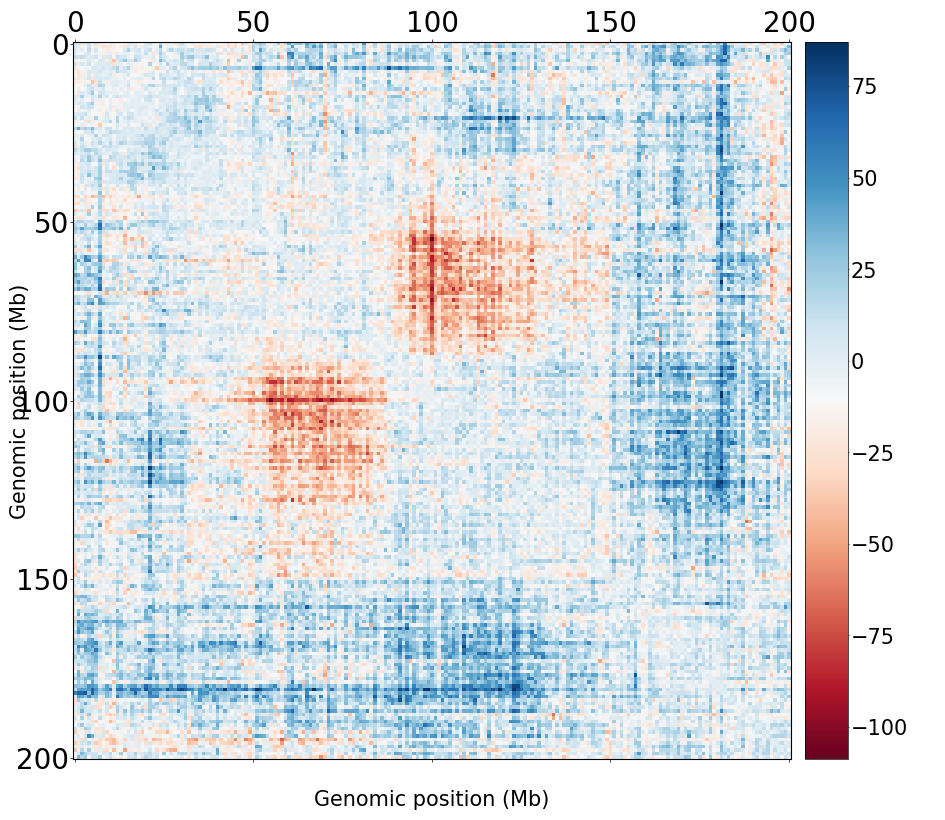

In [139]:
plt.close('all')
plot_distance_matrix(sub_median, cmap_order="forward", colorbar_labels=' ')
plt.show()

- Red areas means that in the ON cells, the loci pairs are closer together than that in OFF cells.
- Blue areas means that in the ON cells, the loci pairs are further apart than that OFF cells.
The big red/blue clusters specifies that , specific regions become compact and become open.

# Run ChromaFactor

In [140]:

reshaped_on = np.transpose(positives, (1, 2, 0)) #n_pos,L,L to L,L,n_pos (distance matrix per cell)
reshaped_off = np.transpose(negatives, (1, 2, 0))
reshaped_maps = np.concatenate((reshaped_on, reshaped_off), axis=2)

# Create arrays of 1 and 0
ones_array = np.ones(reshaped_on.shape[2])
zeros_array = np.zeros(reshaped_off.shape[2])

# Concatenate the arrays
y = np.concatenate((ones_array, zeros_array))
reshaped_clean = np.nan_to_num(reshaped_maps) #replaces nan with 0
no_components = 20 #NMF componenets

In [141]:
reshaped_array = reshaped_clean.transpose(2, 0, 1) #each cell one sample

In [142]:
# Run ChromaFactor(NMF)
chroma_factor = ChromaFactor(reshaped_array)

In [143]:
#Extract NMF results
nmf_maps = chroma_factor.nmf_maps #templates(W)
components = chroma_factor.components #(weights)
new_reshaped_maps = chroma_factor.reconstruct_maps()
error = chroma_factor.reconstruction_err

In [144]:
nmf_maps.shape #L=201 , features=40401

(40401, 20)

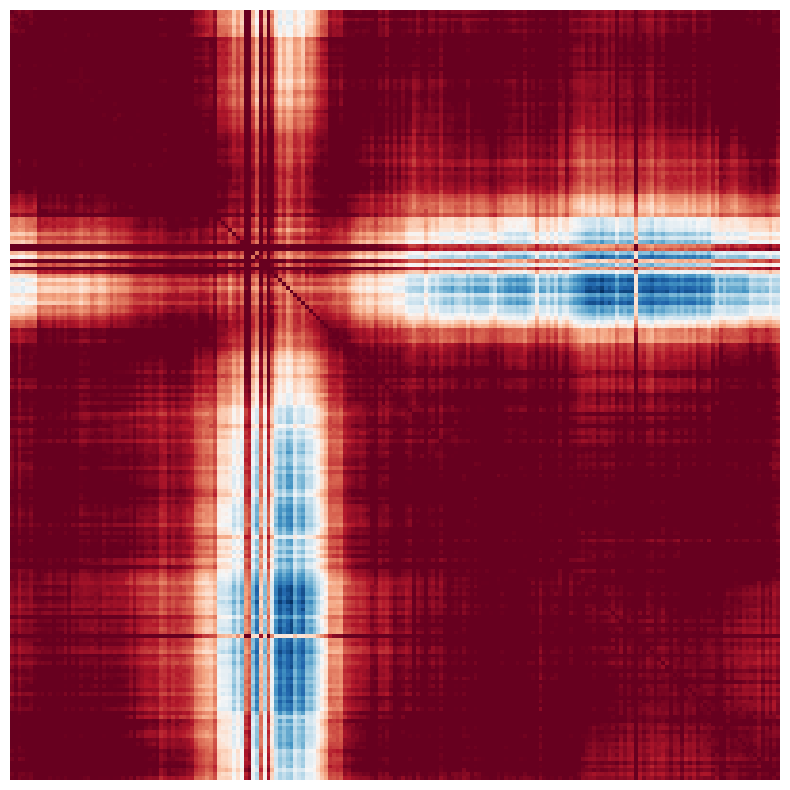

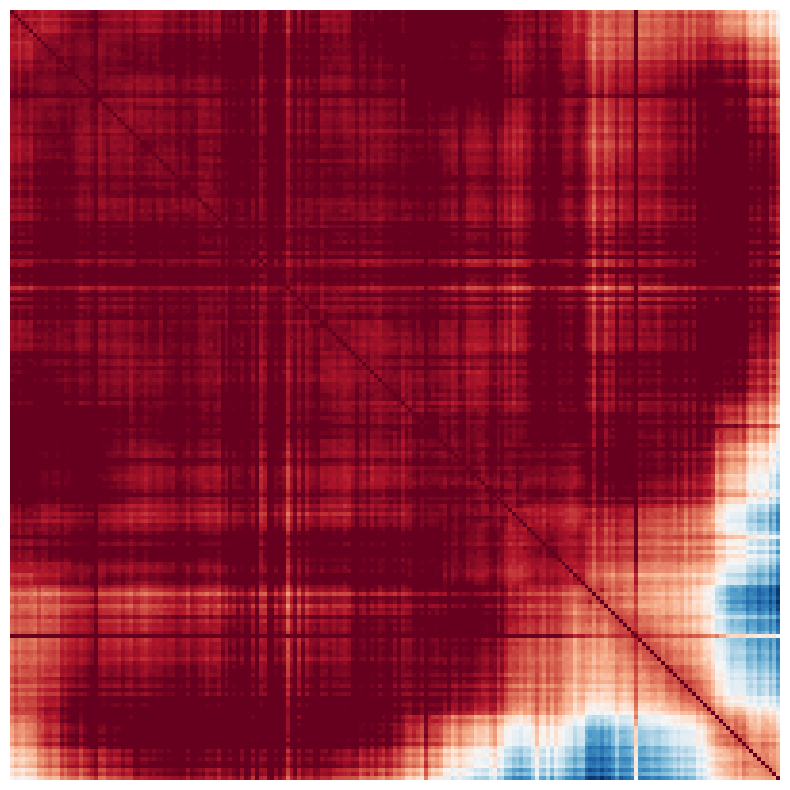

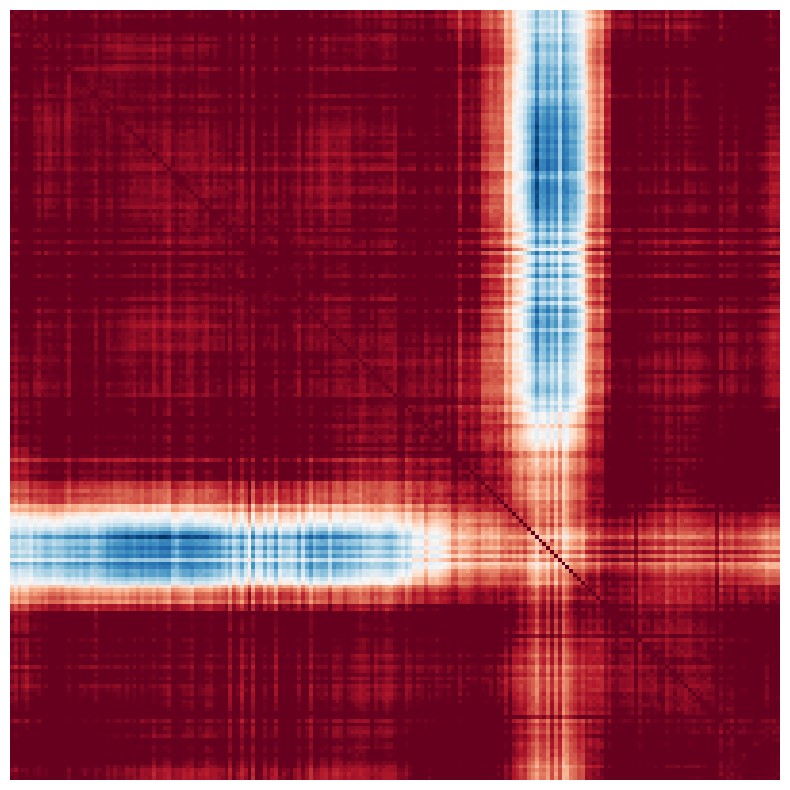

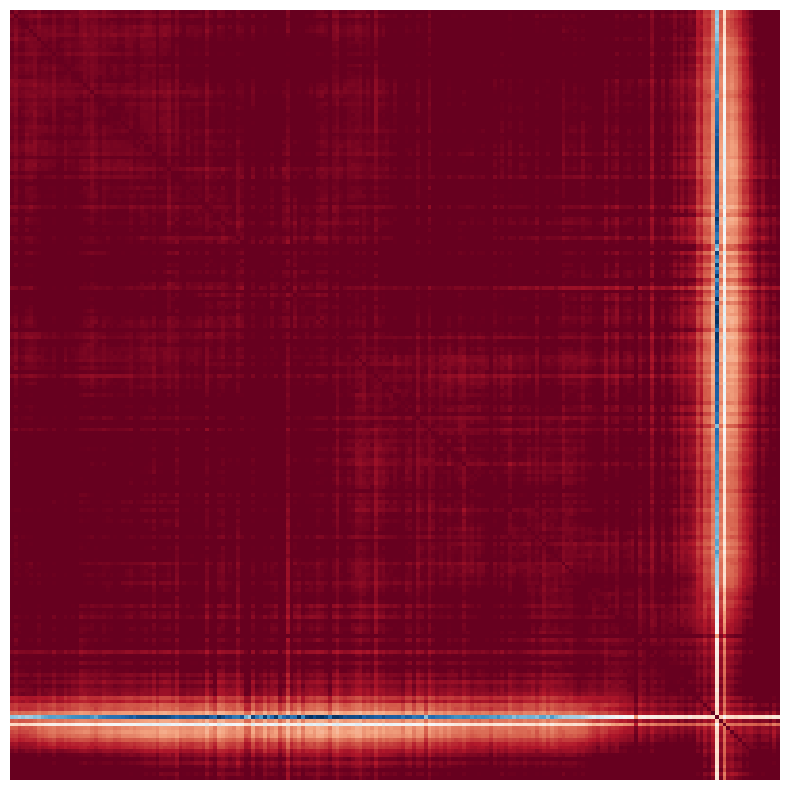

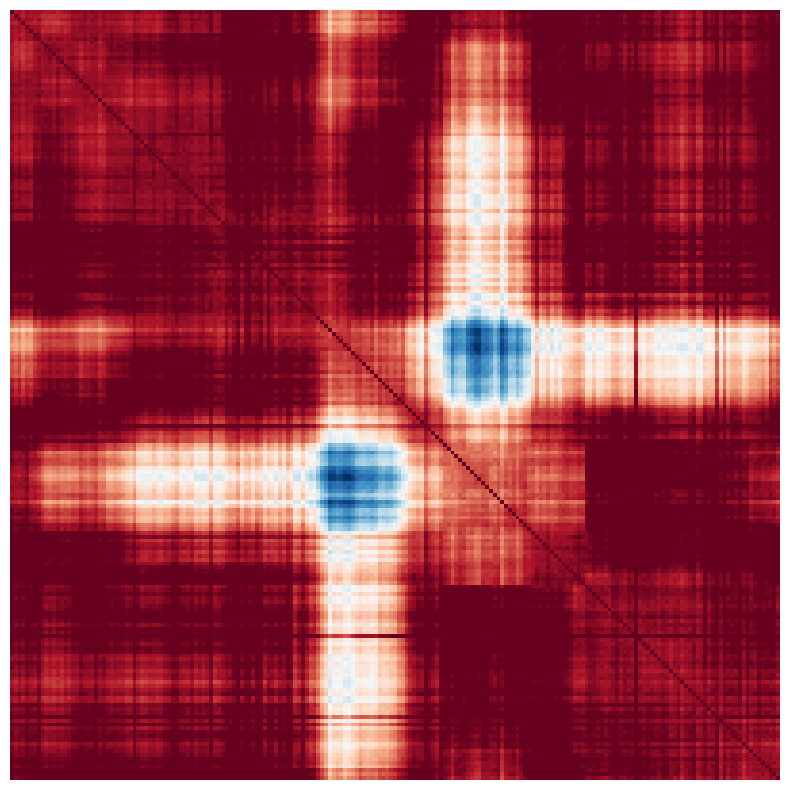

...

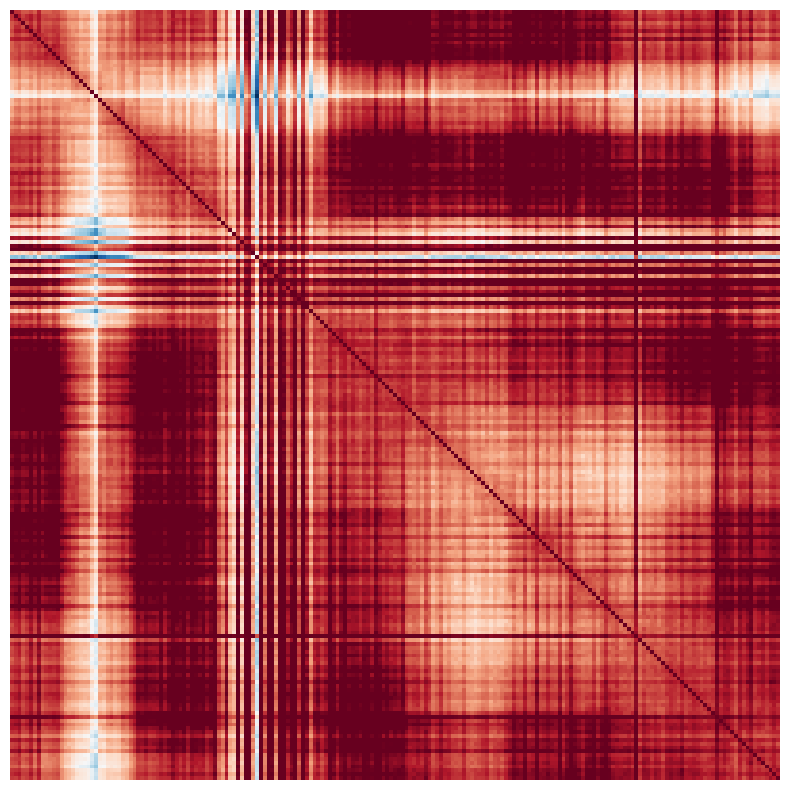

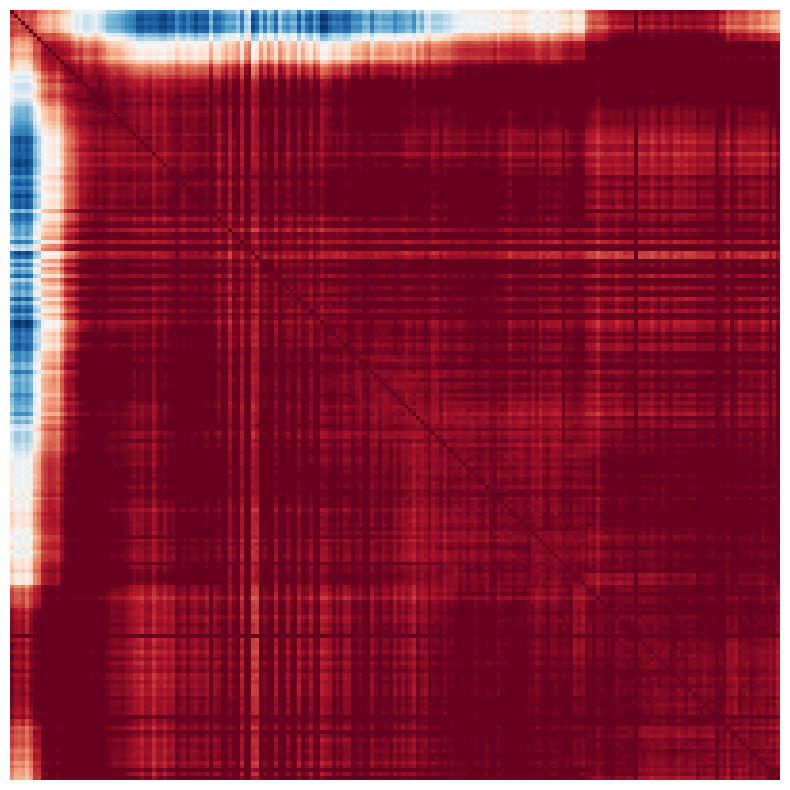

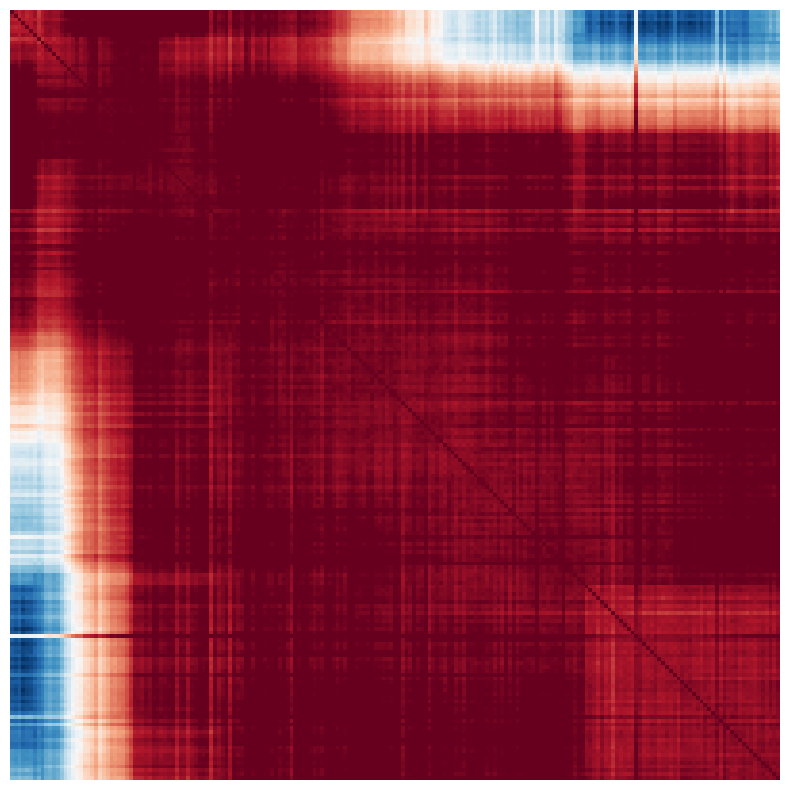

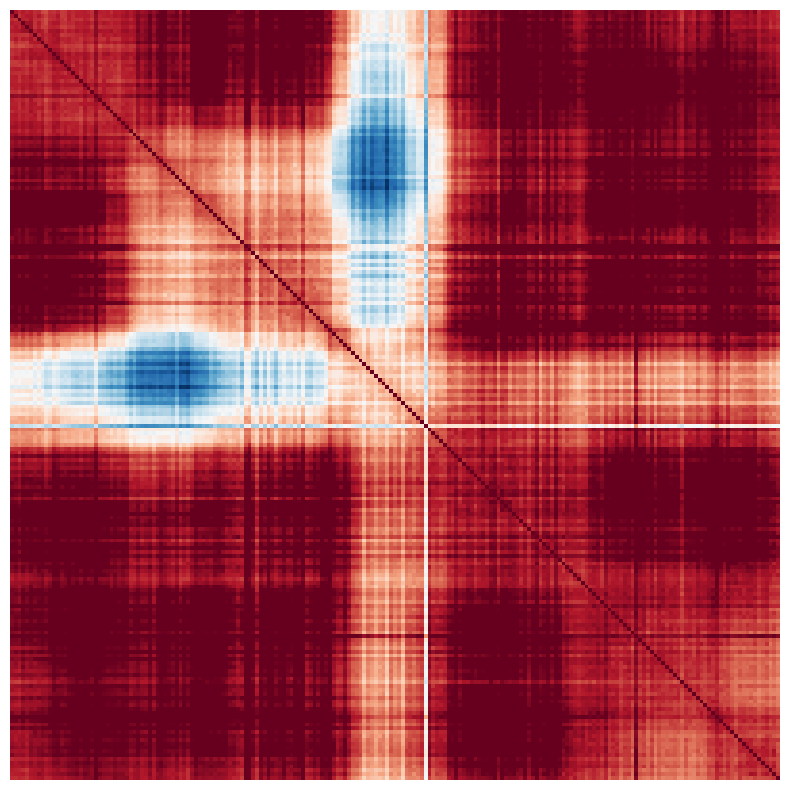

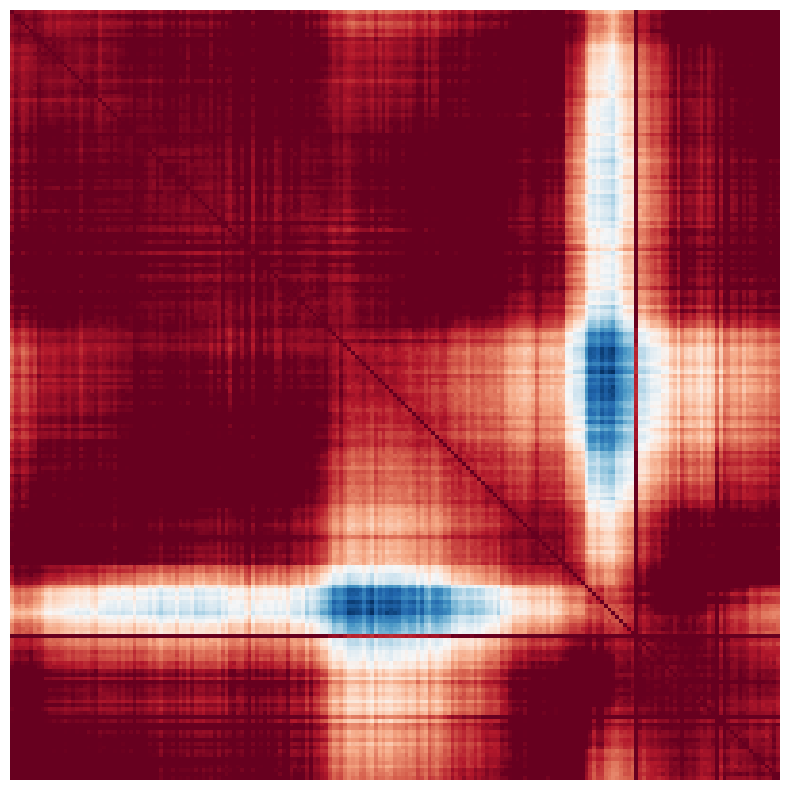

In [145]:
# Plot templates
chroma_factor.plot_nmf_maps()

- The plots gives the structural pattern learned from distance maps

# Component Significance

In [146]:
import scipy.stats as stats

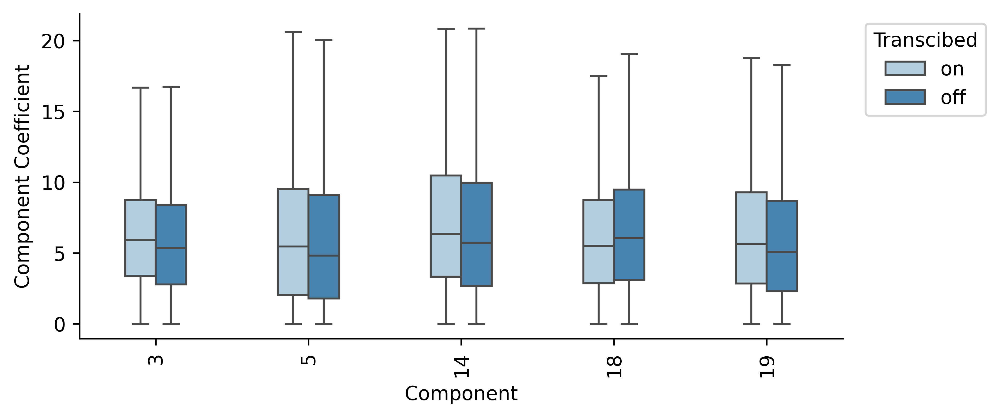

In [147]:
alpha =0.05 # significance cutoff

componentF = pd.DataFrame(components.T)
X = components

# List to hold significantly different components
significant_components = []
pvals = []

df = componentF
df["Cell_State"] = y


# List to hold significantly different components
significant_components = []
pvals = []

# Perform Manan-Whitney U test for each component
for component in df.columns[:-1]:  # Exclude the "Cell_State" column
    positive_values = df[df["Cell_State"] == 1][component]
    negative_values = df[df["Cell_State"] == 0][component]
    
    # Perform the test
    _, p_value = stats.mannwhitneyu(positive_values, negative_values, alternative='two-sided')

    # If the p-value is less than alpha, the difference is significant
    if p_value < alpha:
        significant_components.append(component)
        pvals.append(p_value)

# Filter the DataFrame to include only significant components
df_significant = df[significant_components + ["Cell_State"]]

# Convert DataFrame from wide to long format for easy plotting
df_melted = pd.melt(df_significant, id_vars="Cell_State", var_name="Component", value_name="Value")


df_melted['Cell_State'] = df_melted['Cell_State'].replace({0: 'off', 1: 'on'})

mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

figure(figsize=(7,3), dpi=600)


ax = sns.boxplot(data=df_melted, x="Component", y="Value", hue="Cell_State", showfliers=False,
                 width=0.4,
             palette="Blues")
ax.legend(bbox_to_anchor= (1.2,1))


# Set the legend title
plt.gca().get_legend().set_title('Transcibed')

# Set the legend labels
plt.gcf().set_facecolor('none')

plt.xticks(rotation=90)  # Rotate x-axis labels if needed
plt.ylabel('Component Coefficient')
plt.show()


#### The above code block is to find which NMF weights are significantly different between ON and OFF cells, 3,5,14,18,19 these components are statistically significant, here ON is light blue OFF is dark blue
- In this plot, the ON cells have slighly more component weights compared to OFF 

## Summary of figures

<hr style="height:3px; background-color:black; border:none;">


### 1. From the figure 1 we can understand that:
- The bulk median distance maps can hide the single molecule heterogeneity
- Here distance maps and contact maps are build
- NMF is computed but in single molecule level in this figure which which be carried forward to figure 2
### 2. Figure 2 showed how the NMF output matrices has to be interpreted :
- Along with that, UMAP embedding was done
- Single molecules were selected with weight
- Raw and reconstructed maps were visualized
- Median distance maps of subpopulations dominated by each template were taken
### 3. Figure 3 correlated the NMF templates to transcription,also:
- Random forest models were used to predict the transcription
- Feature importance showed the prective nature of few templates
- Mann-Whitney tests demonstrated that several templates have highly significant differences in the weight between transcribing and non-transcribing molecules
### 4. Figure 4
- From the fig. 4 it is evident that whatever what discovered in the previous 3 figures are evident in humam cell also, that is 3D genome features can be conserved across